In [1]:
print("Hello World!")

Hello World!


In [2]:
import librosa
import numpy as np
import matplotlib.pyplot as plt
import IPython.display as ipd
import librosa.display
from IPython.display import Audio
from scipy import stats

In [3]:
y, sr = librosa.load("yours.mp3")

In [4]:
# loading the audio file
# sphinx_gallery_thumbnail_path = '_static/playback-thumbnail.png'

# We'll need IPython.display's Audio widget

In [5]:
Audio(data=y, rate=sr)

In [6]:
print(y)

[ 0.0000000e+00  0.0000000e+00  0.0000000e+00 ... -3.6860119e-08
 -4.2679218e-08  3.3192464e-07]


In [7]:
# estimating the tempo of the song
onset_env = librosa.onset.onset_strength(y=y, sr=sr)
tempo = librosa.beat.tempo(onset_envelope=onset_env, sr=sr)
tempo

array([89.10290948])

In [8]:
# class that uses the librosa library to analyze the key that an mp3 is in
# arguments:
#     waveform: an mp3 file loaded by librosa, ideally separated out from any percussive sources
#     sr: sampling rate of the mp3, which can be obtained when the file is read with librosa
#     tstart and tend: the range in seconds of the file to be analyzed; default to the beginning and end of file if not specified
class Tonal_Fragment(object):
    def __init__(self, waveform, sr, tstart=None, tend=None):
        self.waveform = waveform
        self.sr = sr
        self.tstart = tstart
        self.tend = tend
        
        if self.tstart is not None:
            self.tstart = librosa.time_to_samples(self.tstart, sr=self.sr)
        if self.tend is not None:
            self.tend = librosa.time_to_samples(self.tend, sr=self.sr)
        self.y_segment = self.waveform[self.tstart:self.tend]
        self.chromograph = librosa.feature.chroma_cqt(y=self.y_segment, sr=self.sr, bins_per_octave=24)
        
        # chroma_vals is the amount of each pitch class present in this time interval
        self.chroma_vals = []
        for i in range(12):
            self.chroma_vals.append(np.sum(self.chromograph[i]))
        pitches = ['C','C#','D','D#','E','F','F#','G','G#','A','A#','B']
        # dictionary relating pitch names to the associated intensity in the song
        self.keyfreqs = {pitches[i]: self.chroma_vals[i] for i in range(12)} 
        
        keys = [pitches[i] + ' major' for i in range(12)] + [pitches[i] + ' minor' for i in range(12)]

        # use of the Krumhansl-Schmuckler key-finding algorithm, which compares the chroma
        # data above to typical profiles of major and minor keys:
        maj_profile = [6.35, 2.23, 3.48, 2.33, 4.38, 4.09, 2.52, 5.19, 2.39, 3.66, 2.29, 2.88]
        min_profile = [6.33, 2.68, 3.52, 5.38, 2.60, 3.53, 2.54, 4.75, 3.98, 2.69, 3.34, 3.17]

        # finds correlations between the amount of each pitch class in the time interval and the above profiles,
        # starting on each of the 12 pitches. then creates dict of the musical keys (major/minor) to the correlation
        self.min_key_corrs = []
        self.maj_key_corrs = []
        for i in range(12):
            key_test = [self.keyfreqs.get(pitches[(i + m)%12]) for m in range(12)]
            # correlation coefficients (strengths of correlation for each key)
            self.maj_key_corrs.append(round(np.corrcoef(maj_profile, key_test)[1,0], 3))
            self.min_key_corrs.append(round(np.corrcoef(min_profile, key_test)[1,0], 3))
            
        # names of all major and minor keys
        self.key_dict = {**{keys[i]: self.maj_key_corrs[i] for i in range(12)}, 
                         **{keys[i+12]: self.min_key_corrs[i] for i in range(12)}}
        
        # this attribute represents the key determined by the algorithm
        self.key = max(self.key_dict, key=self.key_dict.get)
        self.bestcorr = max(self.key_dict.values())
        
        # this attribute represents the second-best key determined by the algorithm,
        # if the correlation is close to that of the actual key determined
        self.altkey = None
        self.altbestcorr = None

        for key, corr in self.key_dict.items():
            if corr > self.bestcorr*0.9 and corr != self.bestcorr:
                self.altkey = key
                self.altbestcorr = corr
                
    # prints the relative prominence of each pitch class            
    def print_chroma(self):
        self.chroma_max = max(self.chroma_vals)
        for key, chrom in self.keyfreqs.items():
            print(key, '\t', f'{chrom/self.chroma_max:5.3f}')
                
    # prints the correlation coefficients associated with each major/minor key
    def corr_table(self):
        for key, corr in self.key_dict.items():
            print(key, '\t', f'{corr:6.3f}')
    
    def correlation_coefficients(self):
        return self.key_dict.items()
    
    # printout of the key determined by the algorithm; if another key is close, that key is mentioned
    def print_key(self):
        print("likely key: ", max(self.key_dict, key=self.key_dict.get), ", correlation: ", self.bestcorr, sep='')
        if self.altkey is not None:
                print("also possible: ", self.altkey, ", correlation: ", self.altbestcorr, sep='')
    
    # prints a chromagram of the file, showing the intensity of each pitch class over time
    def chromagram(self, title=None):
        C = librosa.feature.chroma_cqt(y=self.waveform, sr=sr, bins_per_octave=24)
        plt.figure(figsize=(12,4))
        librosa.display.specshow(C, sr=sr, x_axis='time', y_axis='chroma', vmin=0, vmax=1)
        if title is None:
            plt.title('Chromagram')
        else:
            plt.title(title)
        plt.colorbar()
        plt.tight_layout()
        plt.show()

In [9]:
# this audio takes a long time to load because it has a very high sampling rate; be patient.
# the load function generates a tuple consisting of an audio object y and its sampling rate sr
# this function filters out the harmonic part of the sound file from the percussive part, allowing for
# more accurate harmonic analysis
y_harmonic, y_percussive = librosa.effects.hpss(y)

In [10]:
# this block instantiates the Tonal_Fragment class with the first 22 seconds of the above harmonic part of une barque.
# the three methods called will print the determined key of the song, the correlation coefficients for all keys,
# and a chromogram, which shows the intensity of frequencies associated with each of the 12 pitch classes over time.

unebarque_fsharp_min = Tonal_Fragment(y_harmonic, sr, tend=22)
unebarque_fsharp_min.print_chroma()

C 	 0.463
C# 	 0.493
D 	 0.983
D# 	 0.546
E 	 1.000
F 	 0.764
F# 	 0.989
G 	 0.677
G# 	 0.357
A 	 0.786
A# 	 0.491
B 	 0.760


likely key: D major, correlation: 0.707
C major 	  0.108
C# major 	 -0.518
D major 	  0.707
D# major 	 -0.569
E major 	  0.256
F major 	 -0.005
F# major 	 -0.077
G major 	  0.359
G# major 	 -0.824
A major 	  0.505
A# major 	 -0.128
B major 	  0.187
C minor 	 -0.524
C# minor 	 -0.140
D minor 	  0.405
D# minor 	 -0.098
E minor 	  0.479
F minor 	 -0.512
F# minor 	  0.458
G minor 	 -0.029
G# minor 	 -0.375
A minor 	  0.209
A# minor 	 -0.437
B minor 	  0.565


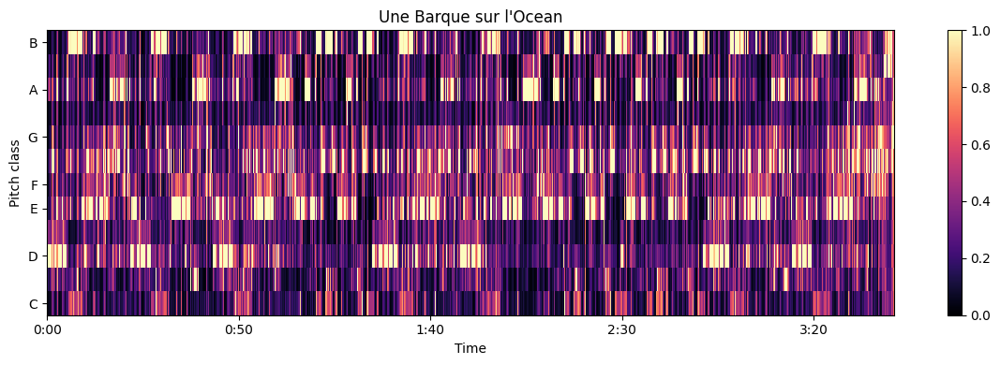

In [11]:
unebarque_fsharp_min.print_key()
unebarque_fsharp_min.corr_table()
unebarque_fsharp_min.chromagram("Une Barque sur l\'Ocean")

In [12]:
# parts of the song that are more tonally ambiguous will show two keys with print_key(),
# if they are similarly well-correlated.
# this section of une barque is in E minor, though the algorithm suggests that it is in D major, a closely related key,
# though E minor is also listed since their correlation coefficients are very close.
unebarque_e_min = Tonal_Fragment(y_harmonic, sr, tstart=0)
unebarque_e_min.print_key()
unebarque_e_min.corr_table()

likely key: E minor, correlation: 0.603
also possible: B minor, correlation: 0.566
C major 	  0.175
C# major 	 -0.504
D major 	  0.590
D# major 	 -0.625
E major 	  0.368
F major 	 -0.004
F# major 	 -0.061
G major 	  0.370
G# major 	 -0.844
A major 	  0.466
A# major 	 -0.200
B major 	  0.268
C minor 	 -0.544
C# minor 	 -0.088
D minor 	  0.281
D# minor 	 -0.164
E minor 	  0.603
F minor 	 -0.454
F# minor 	  0.401
G minor 	 -0.091
G# minor 	 -0.308
A minor 	  0.227
A# minor 	 -0.429
B minor 	  0.566


In [13]:
# in the case of une barque sur l'ocean (and other songs), predictions become less reliable over short time frames
# the below block prints the predicted key of every 3-second-long cut of the piece.
bin_size = 3
for i in range(24):
    fragment = Tonal_Fragment(y_harmonic, sr, tstart = bin_size*i, tend=bin_size*(i+1))
    print(bin_size*i,"sec:",fragment.key)
    if fragment.altkey is not None:
        print("\t or:", fragment.altkey)

0 sec: D major
3 sec: D major
6 sec: B minor
9 sec: E minor
12 sec: E minor
15 sec: F# minor
18 sec: D major
21 sec: D minor
24 sec: D minor
	 or: D major
27 sec: B minor
30 sec: B minor
33 sec: E minor
36 sec: A major
	 or: D minor
39 sec: A major
	 or: A minor
42 sec: D minor
	 or: A major
45 sec: D minor
	 or: D major
48 sec: B minor
51 sec: B minor
54 sec: E minor
57 sec: E minor
60 sec: D major
	 or: G minor
63 sec: E minor
66 sec: A major
69 sec: E minor


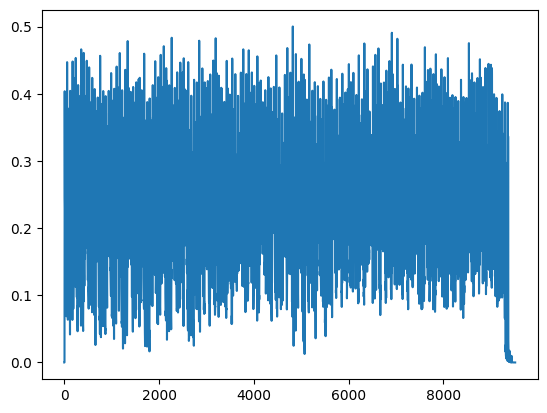

In [14]:
# getting volume graph
rms = librosa.feature.rms(y=y)
plt.plot(rms[0])
plt.show()

In [15]:
print(rms)
print(np.mean(rms[0]))
print(np.max(rms[0]))

[[2.2575588e-09 1.1818693e-07 6.0738112e-06 ... 1.5098095e-05
  1.2423365e-05 9.0281601e-06]]
0.20777585
0.50007653


['reflections.mp3', 'moonlightsonata.mp3', 'n95.mp3', 'lolita-Copy1.mp3', 'nightcoffee.mp3', 'spring-Copy1.mp3', 'yours.mp3', 'nortoncommander.mp3', 'glimpseofus.mp3', 'iknow.mp3', 'misstherage.mp3', 'desertrose.mp3', 'gymnopedie.mp3', 'perhaps.mp3', 'thefutureisnow.mp3', 'glow.mp3', 'winterwonderland.mp3', 'heaviestmatter.mp3', 'onmyside.mp3', 'mindplay.mp3', '.ipynb_checkpoints', 'furelise.mp3', 'london-Copy1.mp3', 'alive.mp3', 'bheegibheegi.mp3', 'happy.mp3', 'flyingwhales.mp3', 'tu.mp3', 'chanel-Copy1.mp3', 'love&war.mp3', 'ungrateful.mp3']
reflections.mp3
[0. 0. 0. ... 0. 0. 0.]
[107.66601562]
C 	 0.743
C# 	 0.367
D 	 0.518
D# 	 0.295
E 	 0.660
F 	 0.423
F# 	 0.205
G 	 0.521
G# 	 0.331
A 	 1.000
A# 	 0.537
B 	 0.408
likely key: A minor, correlation: 0.899
C major 	  0.567
C# major 	 -0.543
D major 	  0.282
D# major 	 -0.207
E major 	  0.096
F major 	  0.508
F# major 	 -0.671
G major 	  0.307
G# major 	 -0.342
A major 	  0.497
A# major 	  0.065
B major 	 -0.559
C minor 	  0.038
C# 

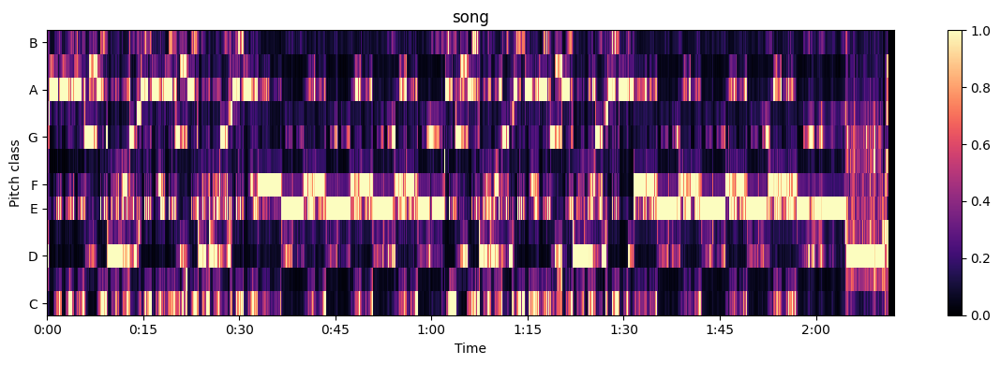

moonlightsonata.mp3


[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.
/Users/kirtisubramanian/Library/Python/3.9/lib/python/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


[ 0.          0.          0.         ... -0.00130089 -0.00109478
 -0.00098484]
[112.34714674]
C 	 0.194
C# 	 0.687
D 	 0.381
D# 	 0.293
E 	 0.699
F 	 0.322
F# 	 0.511
G 	 0.276
G# 	 1.000
A 	 0.650
A# 	 0.163
B 	 0.196
likely key: C# minor, correlation: 0.756
C major 	 -0.298
C# major 	  0.447
D major 	  0.089
D# major 	 -0.354
E major 	  0.535
F major 	 -0.395
F# major 	  0.060
G major 	 -0.331
G# major 	  0.282
A major 	  0.527
A# major 	 -0.597
B major 	  0.035
C minor 	 -0.427
C# minor 	  0.756
D minor 	 -0.174
D# minor 	 -0.241
E minor 	 -0.084
F minor 	  0.136
F# minor 	  0.460
G minor 	 -0.531
G# minor 	  0.373
A minor 	  0.087
A# minor 	 -0.139
B minor 	 -0.215


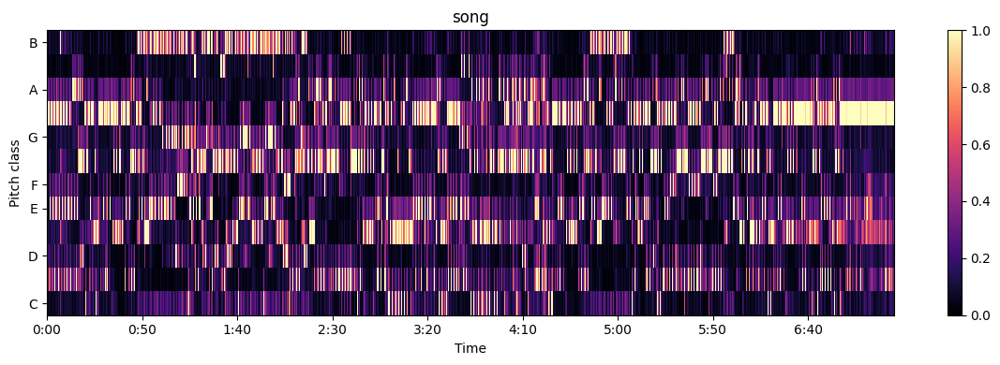

n95.mp3
[0. 0. 0. ... 0. 0. 0.]
[143.5546875]
C 	 0.993
C# 	 0.765
D 	 0.720
D# 	 0.602
E 	 0.782
F 	 1.000
F# 	 0.677
G 	 0.752
G# 	 0.713
A 	 0.861
A# 	 0.897
B 	 0.868
likely key: F major, correlation: 0.826
C major 	  0.513
C# major 	 -0.124
D major 	 -0.262
D# major 	 -0.190
E major 	 -0.150
F major 	  0.826
F# major 	 -0.294
G major 	 -0.009
G# major 	 -0.157
A major 	 -0.125
A# major 	  0.332
B major 	 -0.358
C minor 	  0.090
C# minor 	 -0.274
D minor 	  0.334
D# minor 	 -0.469
E minor 	 -0.027
F minor 	  0.432
F# minor 	 -0.281
G minor 	 -0.049
G# minor 	 -0.399
A minor 	  0.537
A# minor 	  0.281
B minor 	 -0.175


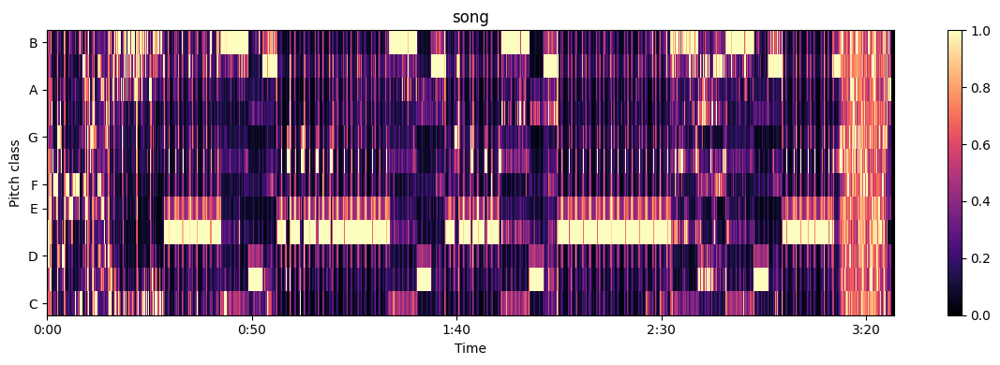

lolita-Copy1.mp3
[-4.6801439e-08 -5.5386405e-08 -4.5350479e-08 ... -4.5207052e-08
 -4.7819757e-08  1.1440590e-07]
[135.99917763]
C 	 1.000
C# 	 0.703
D 	 0.523
D# 	 0.371
E 	 0.278
F 	 0.330
F# 	 0.465
G 	 0.960
G# 	 0.540
A 	 0.274
A# 	 0.309
B 	 0.360
likely key: C minor, correlation: 0.614
also possible: C major, correlation: 0.564
C major 	  0.564
C# major 	  0.092
D major 	 -0.079
D# major 	  0.072
E major 	 -0.427
F major 	  0.068
F# major 	 -0.133
G major 	  0.499
G# major 	  0.236
A major 	 -0.391
A# major 	 -0.145
B major 	 -0.357
C minor 	  0.614
C# minor 	 -0.067
D minor 	 -0.172
D# minor 	 -0.363
E minor 	  0.128
F minor 	  0.220
F# minor 	 -0.231
G minor 	  0.301
G# minor 	 -0.219
A minor 	 -0.013
A# minor 	 -0.119
B minor 	 -0.079


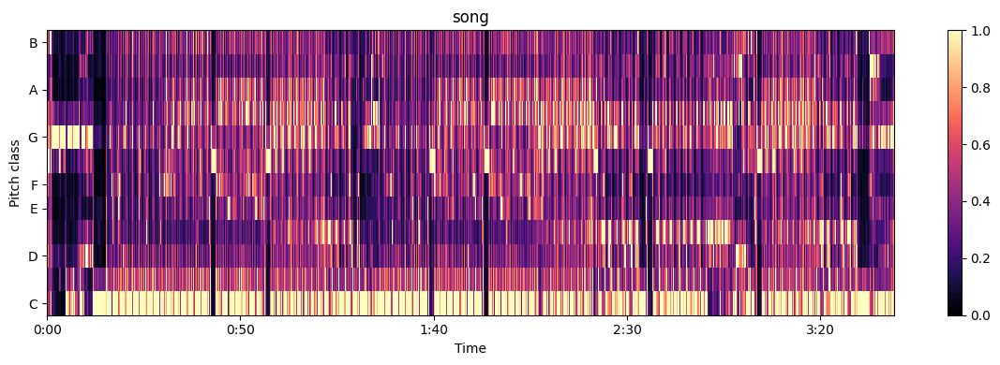

nightcoffee.mp3


/Users/kirtisubramanian/Library/Python/3.9/lib/python/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


[ 0.0000000e+00  0.0000000e+00  0.0000000e+00 ... -6.5336012e-09
  6.8059332e-09 -6.2961805e-09]
[151.99908088]
C 	 0.656
C# 	 0.214
D 	 0.637
D# 	 0.274
E 	 0.334
F 	 0.158
F# 	 0.337
G 	 1.000
G# 	 0.392
A 	 0.412
A# 	 0.189
B 	 0.694
likely key: G major, correlation: 0.93
C major 	  0.563
C# major 	 -0.585
D major 	  0.419
D# major 	 -0.065
E major 	 -0.106
F major 	 -0.037
F# major 	 -0.428
G major 	  0.930
G# major 	 -0.261
A major 	 -0.127
A# major 	 -0.216
B major 	 -0.087
C minor 	  0.393
C# minor 	 -0.379
D minor 	 -0.002
D# minor 	 -0.433
E minor 	  0.561
F minor 	 -0.285
F# minor 	 -0.215
G minor 	  0.438
G# minor 	 -0.069
A minor 	  0.191
A# minor 	 -0.671
B minor 	  0.471


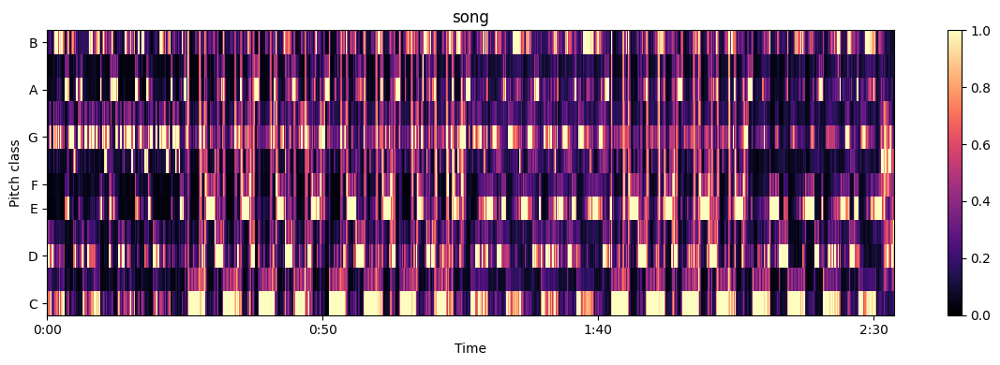

spring-Copy1.mp3
[ 0.0000000e+00  0.0000000e+00  0.0000000e+00 ...  1.1392290e-11
  5.1207202e-11 -3.7205884e-11]
[95.703125]
C 	 0.593
C# 	 0.178
D 	 0.202
D# 	 0.218
E 	 0.703
F 	 1.000
F# 	 0.272
G 	 0.297
G# 	 0.289
A 	 0.389
A# 	 0.214
B 	 0.348
likely key: F major, correlation: 0.691
C major 	  0.551
C# major 	 -0.122
D major 	 -0.282
D# major 	 -0.207
E major 	  0.087
F major 	  0.691
F# major 	 -0.421
G major 	 -0.105
G# major 	 -0.093
A major 	 -0.037
A# major 	  0.135
B major 	 -0.198
C minor 	  0.044
C# minor 	 -0.112
D minor 	  0.285
D# minor 	 -0.358
E minor 	  0.231
F minor 	  0.570
F# minor 	 -0.233
G minor 	 -0.271
G# minor 	 -0.269
A minor 	  0.511
A# minor 	 -0.061
B minor 	 -0.338


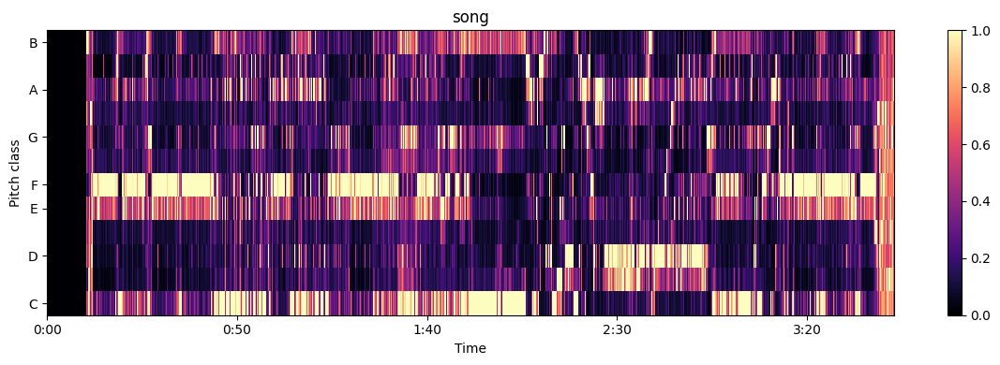

yours.mp3
[ 0.0000000e+00  0.0000000e+00  0.0000000e+00 ... -3.6860119e-08
 -4.2679218e-08  3.3192464e-07]
[89.10290948]
C 	 0.463
C# 	 0.493
D 	 0.983
D# 	 0.546
E 	 1.000
F 	 0.764
F# 	 0.989
G 	 0.677
G# 	 0.357
A 	 0.786
A# 	 0.491
B 	 0.760
likely key: D major, correlation: 0.707
C major 	  0.108
C# major 	 -0.518
D major 	  0.707
D# major 	 -0.569
E major 	  0.256
F major 	 -0.005
F# major 	 -0.077
G major 	  0.359
G# major 	 -0.824
A major 	  0.505
A# major 	 -0.128
B major 	  0.187
C minor 	 -0.524
C# minor 	 -0.140
D minor 	  0.405
D# minor 	 -0.098
E minor 	  0.479
F minor 	 -0.512
F# minor 	  0.458
G minor 	 -0.029
G# minor 	 -0.375
A minor 	  0.209
A# minor 	 -0.437
B minor 	  0.565


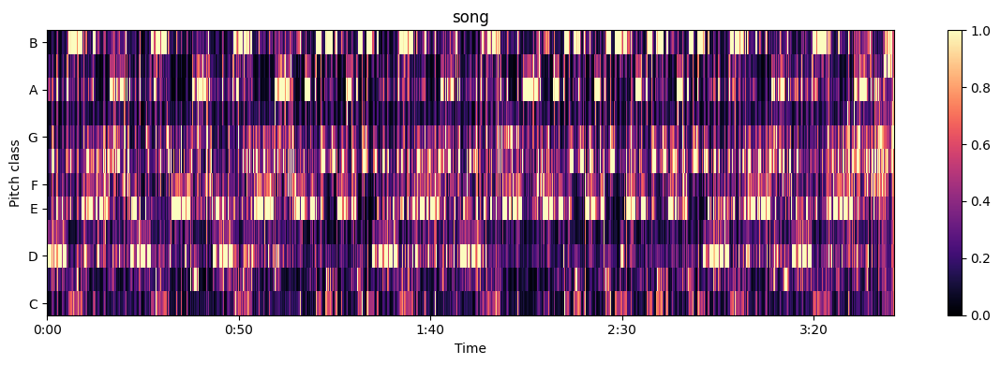

nortoncommander.mp3


/Users/kirtisubramanian/Library/Python/3.9/lib/python/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


[ 0.          0.          0.         ... -0.26482227 -0.2693093
 -0.28930312]
[83.35433468]
C 	 0.581
C# 	 0.915
D 	 0.554
D# 	 0.492
E 	 0.503
F 	 0.367
F# 	 0.320
G 	 0.325
G# 	 0.938
A 	 1.000
A# 	 0.598
B 	 0.566
likely key: C# minor, correlation: 0.592
C major 	 -0.301
C# major 	  0.337
D major 	  0.012
D# major 	 -0.179
E major 	  0.299
F major 	 -0.150
F# major 	 -0.030
G major 	 -0.318
G# major 	  0.324
A major 	  0.497
A# major 	 -0.330
B major 	 -0.161
C minor 	 -0.209
C# minor 	  0.592
D minor 	 -0.041
D# minor 	 -0.294
E minor 	 -0.369
F minor 	  0.031
F# minor 	  0.247
G minor 	 -0.390
G# minor 	  0.252
A minor 	  0.274
A# minor 	  0.116
B minor 	 -0.210


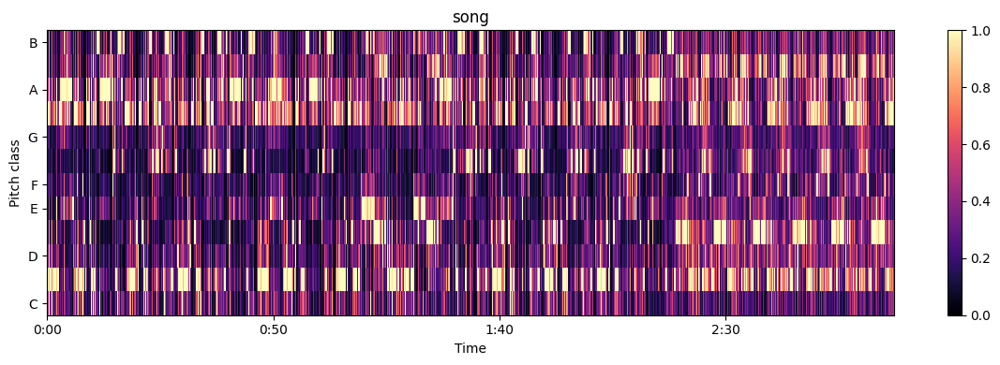

glimpseofus.mp3
[0. 0. 0. ... 0. 0. 0.]
[161.49902344]
C 	 0.577
C# 	 0.433
D 	 0.183
D# 	 0.441
E 	 0.302
F 	 0.890
F# 	 0.453
G 	 0.441
G# 	 1.000
A 	 0.445
A# 	 0.663
B 	 0.394
likely key: F minor, correlation: 0.836
C major 	 -0.092
C# major 	  0.543
D major 	 -0.646
D# major 	  0.330
E major 	 -0.175
F major 	  0.322
F# major 	  0.069
G major 	 -0.566
G# major 	  0.661
A major 	 -0.488
A# major 	  0.204
B major 	 -0.160
C minor 	  0.183
C# minor 	 -0.060
D minor 	 -0.163
D# minor 	  0.064
E minor 	 -0.523
F minor 	  0.836
F# minor 	 -0.237
G minor 	 -0.151
G# minor 	  0.321
A minor 	 -0.086
A# minor 	  0.421
B minor 	 -0.605


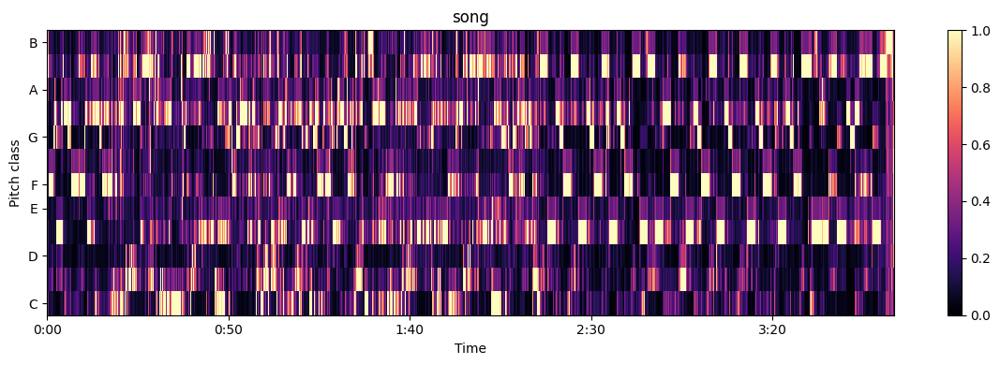

iknow.mp3
[ 0.0000000e+00  0.0000000e+00  0.0000000e+00 ... -6.9967004e-06
 -4.6506921e-06 -4.7812127e-06]
[135.99917763]
C 	 0.329
C# 	 0.568
D 	 0.418
D# 	 0.976
E 	 0.481
F 	 0.379
F# 	 0.641
G 	 0.390
G# 	 0.882
A 	 0.656
A# 	 1.000
B 	 0.758
likely key: D# minor, correlation: 0.693
also possible: G# minor, correlation: 0.658
C major 	 -0.778
C# major 	  0.223
D major 	 -0.311
D# major 	  0.500
E major 	  0.183
F major 	 -0.495
F# major 	  0.440
G major 	 -0.556
G# major 	  0.372
A major 	 -0.117
A# major 	  0.098
B major 	  0.442
C minor 	 -0.102
C# minor 	  0.097
D minor 	 -0.453
D# minor 	  0.693
E minor 	 -0.396
F minor 	 -0.193
F# minor 	 -0.030
G minor 	 -0.057
G# minor 	  0.658
A minor 	 -0.451
A# minor 	  0.323
B minor 	 -0.089


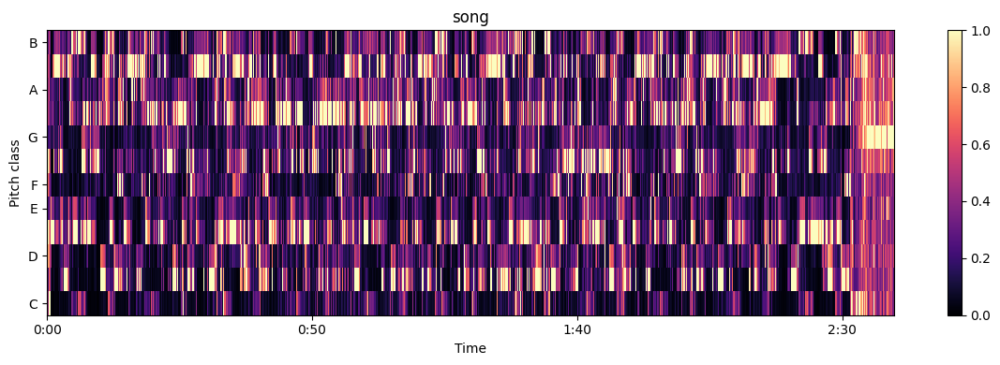

misstherage.mp3
[ 0.          0.          0.         ... -0.00024825  0.00073072
  0.00079551]
[151.99908088]
C 	 0.749
C# 	 0.713
D 	 0.658
D# 	 1.000
E 	 0.671
F 	 0.602
F# 	 0.499
G 	 0.671
G# 	 0.724
A 	 0.495
A# 	 0.525
B 	 0.371
likely key: G# major, correlation: 0.678
also possible: C minor, correlation: 0.627
C major 	  0.078
C# major 	  0.230
D major 	 -0.380
D# major 	  0.597
E major 	 -0.259
F major 	 -0.132
F# major 	 -0.212
G major 	 -0.152
G# major 	  0.678
A major 	 -0.293
A# major 	  0.089
B major 	 -0.243
C minor 	  0.627
C# minor 	  0.185
D minor 	 -0.154
D# minor 	  0.217
E minor 	 -0.122
F minor 	  0.301
F# minor 	 -0.416
G minor 	  0.093
G# minor 	  0.115
A minor 	 -0.199
A# minor 	 -0.051
B minor 	 -0.595


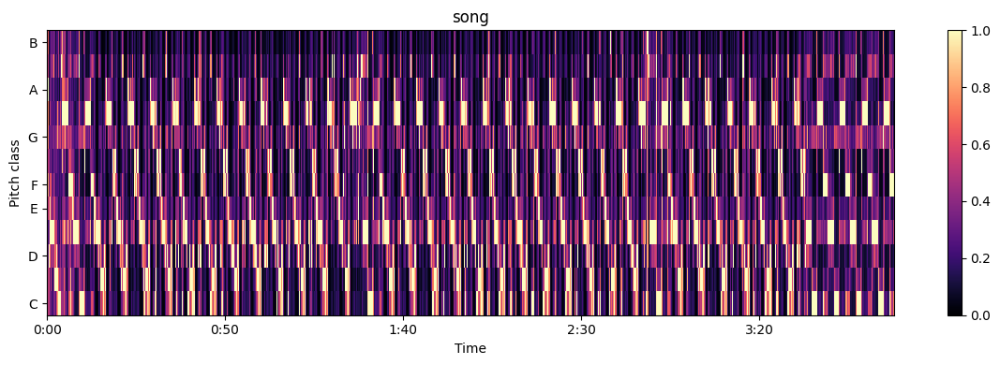

desertrose.mp3


[src/libmpg123/layer1.c:I_step_two():190] error: 250 bits needed, 204 available
[src/libmpg123/layer1.c:INT123_do_layer1():237] error: Aborting layer I decoding after step two.
[src/libmpg123/layer1.c:check_balloc():30] error: Illegal bit allocation value.
[src/libmpg123/layer1.c:INT123_do_layer1():228] error: Aborting layer I decoding after step one.
Note: Illegal Audio-MPEG-Header 0x1a8e8dbd at offset 5943.
Note: Trying to resync...
Note: Skipped 4 bytes in input.
[src/libmpg123/layer1.c:check_balloc():30] error: Illegal bit allocation value.
[src/libmpg123/layer1.c:INT123_do_layer1():228] error: Aborting layer I decoding after step one.
Note: Illegal Audio-MPEG-Header 0x80e76a6b at offset 6326.
Note: Trying to resync...
Note: Skipped 383 bytes in input.
[src/libmpg123/layer1.c:I_step_two():190] error: 243 bits needed, 179 available
[src/libmpg123/layer1.c:INT123_do_layer1():237] error: Aborting layer I decoding after step two.
Note: Illegal Audio-MPEG-Header 0x3840648a at offset 698

[ 0.0000000e+00  0.0000000e+00  0.0000000e+00 ... -2.9504423e-05
 -1.8075370e-05 -1.9269657e-05]
[80.74951172]
C 	 1.000
C# 	 0.814
D 	 0.339
D# 	 0.611
E 	 0.636
F 	 0.551
F# 	 0.449
G 	 0.903
G# 	 0.680
A 	 0.349
A# 	 0.433
B 	 0.412
likely key: C minor, correlation: 0.62
C major 	  0.540
C# major 	  0.264
D major 	 -0.511
D# major 	  0.195
E major 	 -0.165
F major 	  0.056
F# major 	 -0.168
G major 	  0.166
G# major 	  0.464
A major 	 -0.401
A# major 	 -0.177
B major 	 -0.264
C minor 	  0.620
C# minor 	  0.225
D minor 	 -0.394
D# minor 	 -0.303
E minor 	  0.212
F minor 	  0.465
F# minor 	 -0.427
G minor 	  0.056
G# minor 	 -0.010
A minor 	  0.012
A# minor 	 -0.003
B minor 	 -0.454


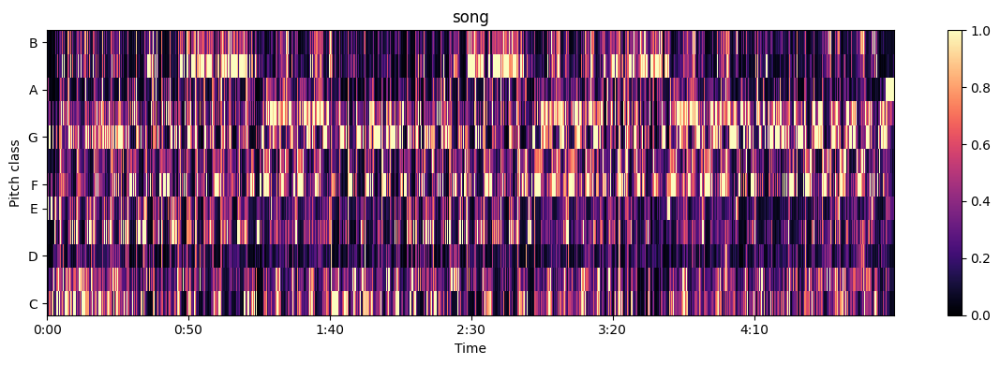

gymnopedie.mp3
[ 0.0000000e+00  0.0000000e+00  0.0000000e+00 ... -7.5406144e-09
  4.2799848e-09  3.4423262e-08]
[117.45383523]
C 	 0.159
C# 	 0.349
D 	 1.000
D# 	 0.404
E 	 0.130
F 	 0.108
F# 	 0.362
G 	 0.551
G# 	 0.214
A 	 0.370
A# 	 0.161
B 	 0.212
likely key: D major, correlation: 0.771
C major 	 -0.045
C# major 	 -0.270
D major 	  0.771
D# major 	 -0.027
E major 	 -0.366
F major 	 -0.182
F# major 	 -0.167
G major 	  0.559
G# major 	 -0.249
A major 	  0.163
A# major 	  0.062
B major 	 -0.247
C minor 	  0.011
C# minor 	 -0.245
D minor 	  0.478
D# minor 	 -0.053
E minor 	 -0.027
F minor 	 -0.455
F# minor 	  0.203
G minor 	  0.465
G# minor 	 -0.299
A minor 	 -0.162
A# minor 	 -0.365
B minor 	  0.450


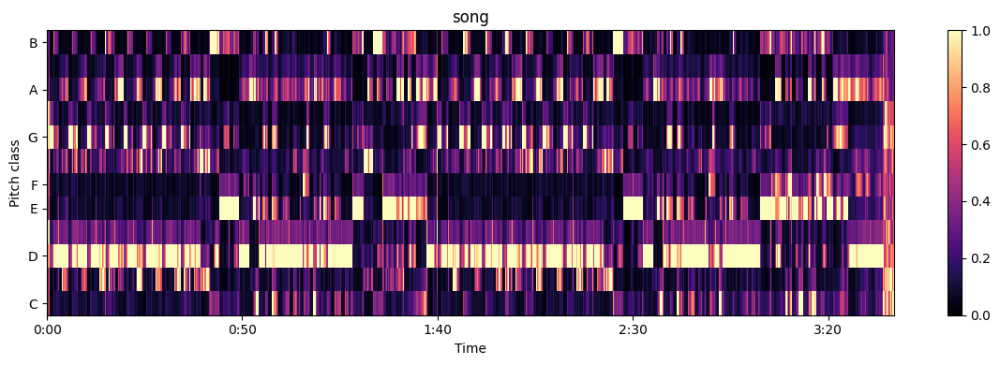

perhaps.mp3


/Users/kirtisubramanian/Library/Python/3.9/lib/python/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


[0. 0. 0. ... 0. 0. 0.]
[103.359375]
C 	 0.773
C# 	 0.677
D 	 0.734
D# 	 0.629
E 	 1.000
F 	 0.790
F# 	 0.531
G 	 0.540
G# 	 0.538
A 	 0.917
A# 	 0.713
B 	 0.702
likely key: A minor, correlation: 0.738
C major 	  0.344
C# major 	 -0.413
D major 	  0.129
D# major 	 -0.375
E major 	  0.389
F major 	  0.432
F# major 	 -0.513
G major 	 -0.009
G# major 	 -0.403
A major 	  0.594
A# major 	  0.062
B major 	 -0.236
C minor 	 -0.257
C# minor 	  0.192
D minor 	  0.450
D# minor 	 -0.469
E minor 	  0.336
F minor 	 -0.091
F# minor 	 -0.044
G minor 	 -0.254
G# minor 	 -0.360
A minor 	  0.738
A# minor 	 -0.124
B minor 	 -0.118


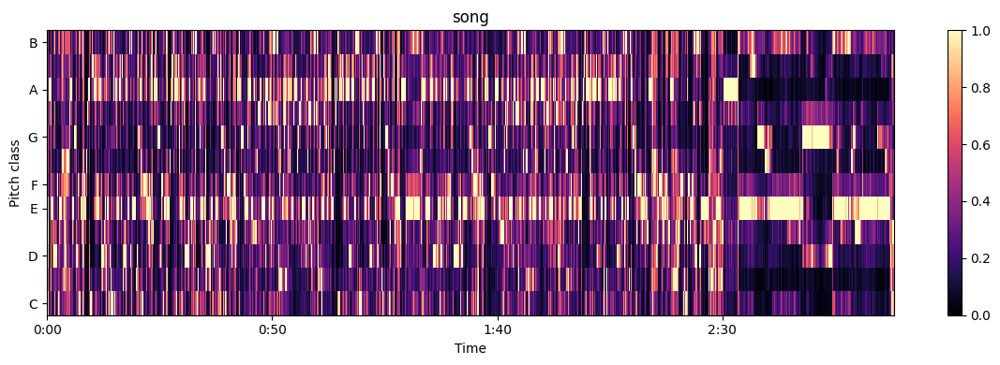

thefutureisnow.mp3


/Users/kirtisubramanian/Library/Python/3.9/lib/python/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


[ 0.0000000e+00  0.0000000e+00  0.0000000e+00 ... -3.8040228e-06
 -1.0471062e-05 -1.6640490e-05]
[117.45383523]
C 	 0.946
C# 	 0.666
D 	 1.000
D# 	 0.723
E 	 0.800
F 	 0.616
F# 	 0.304
G 	 0.402
G# 	 0.331
A 	 0.878
A# 	 0.559
B 	 0.582
likely key: A minor, correlation: 0.585
also possible: D minor, correlation: 0.561
C major 	  0.389
C# major 	 -0.439
D major 	  0.271
D# major 	 -0.141
E major 	 -0.060
F major 	  0.385
F# major 	 -0.552
G major 	  0.206
G# major 	 -0.198
A major 	  0.388
A# major 	  0.161
B major 	 -0.410
C minor 	  0.181
C# minor 	 -0.001
D minor 	  0.561
D# minor 	 -0.352
E minor 	  0.105
F minor 	 -0.172
F# minor 	 -0.145
G minor 	 -0.027
G# minor 	 -0.487
A minor 	  0.585
A# minor 	 -0.214
B minor 	 -0.035


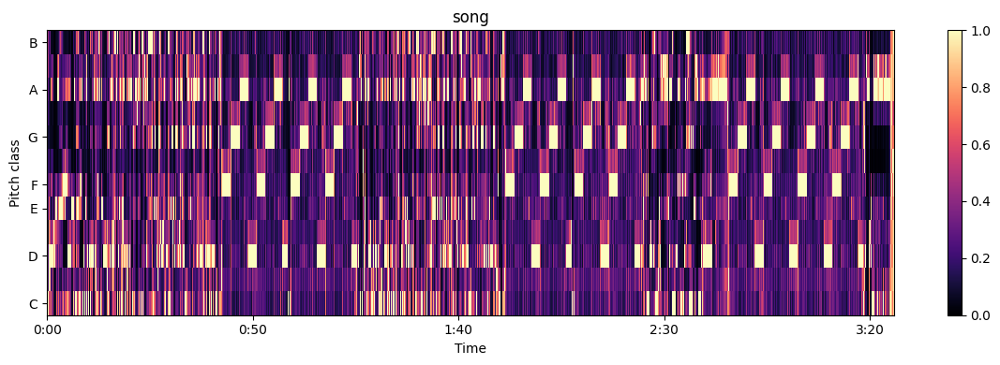

glow.mp3


/Users/kirtisubramanian/Library/Python/3.9/lib/python/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


[ 0.000000e+00  0.000000e+00  0.000000e+00 ... -3.228346e-05 -8.581824e-06
 -4.538208e-06]
[123.046875]
C 	 0.096
C# 	 0.202
D 	 1.000
D# 	 0.413
E 	 0.434
F 	 0.255
F# 	 0.343
G 	 0.336
G# 	 0.191
A 	 0.657
A# 	 0.284
B 	 0.153
likely key: D major, correlation: 0.822
C major 	 -0.052
C# major 	 -0.453
D major 	  0.822
D# major 	 -0.132
E major 	 -0.114
F major 	  0.017
F# major 	 -0.354
G major 	  0.336
G# major 	 -0.424
A major 	  0.500
A# major 	  0.170
B major 	 -0.315
C minor 	 -0.252
C# minor 	 -0.184
D minor 	  0.703
D# minor 	 -0.117
E minor 	  0.030
F minor 	 -0.494
F# minor 	  0.278
G minor 	  0.314
G# minor 	 -0.393
A minor 	  0.186
A# minor 	 -0.360
B minor 	  0.289


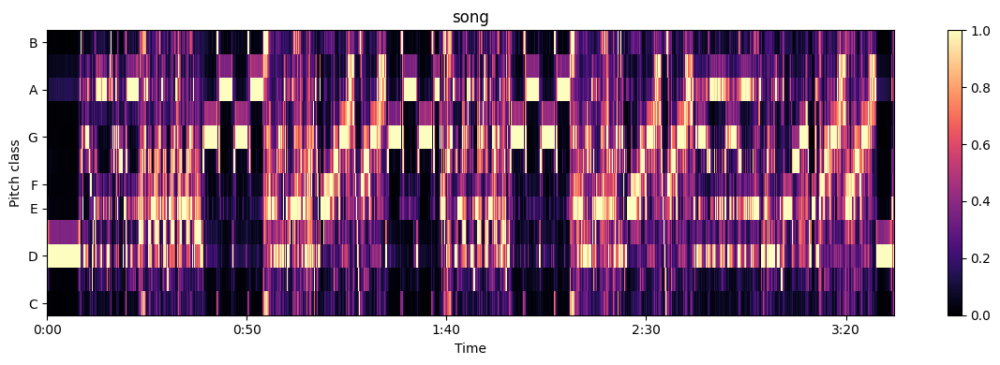

winterwonderland.mp3


/Users/kirtisubramanian/Library/Python/3.9/lib/python/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


[0. 0. 0. ... 0. 0. 0.]
[129.19921875]
C 	 0.384
C# 	 0.249
D 	 0.502
D# 	 0.274
E 	 0.254
F 	 0.314
F# 	 0.393
G 	 1.000
G# 	 0.442
A 	 0.437
A# 	 0.283
B 	 0.294
likely key: G major, correlation: 0.748
also possible: G minor, correlation: 0.689
C major 	  0.435
C# major 	 -0.303
D major 	  0.384
D# major 	  0.131
E major 	 -0.357
F major 	  0.057
F# major 	 -0.379
G major 	  0.748
G# major 	 -0.145
A major 	 -0.194
A# major 	  0.008
B major 	 -0.386
C minor 	  0.282
C# minor 	 -0.405
D minor 	  0.122
D# minor 	 -0.375
E minor 	  0.316
F minor 	 -0.071
F# minor 	 -0.116
G minor 	  0.689
G# minor 	 -0.206
A minor 	  0.035
A# minor 	 -0.404
B minor 	  0.133


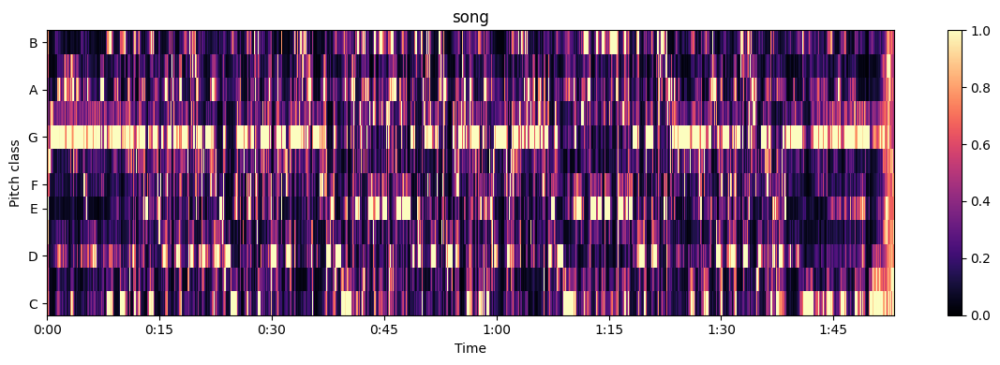

heaviestmatter.mp3


/Users/kirtisubramanian/Library/Python/3.9/lib/python/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


[ 0.0000000e+00  0.0000000e+00  0.0000000e+00 ...  5.3510735e-07
 -4.2405654e-07  3.1078420e-07]
[103.359375]
C 	 0.659
C# 	 0.584
D 	 0.744
D# 	 0.607
E 	 0.745
F 	 0.735
F# 	 0.576
G 	 0.613
G# 	 0.691
A 	 1.000
A# 	 0.791
B 	 0.574
likely key: A minor, correlation: 0.674
C major 	  0.112
C# major 	 -0.310
D major 	  0.311
D# major 	 -0.087
E major 	  0.048
F major 	  0.484
F# major 	 -0.497
G major 	 -0.086
G# major 	 -0.229
A major 	  0.523
A# major 	  0.282
B major 	 -0.551
C minor 	 -0.262
C# minor 	 -0.076
D minor 	  0.594
D# minor 	 -0.390
E minor 	 -0.110
F minor 	 -0.054
F# minor 	  0.115
G minor 	  0.115
G# minor 	 -0.351
A minor 	  0.674
A# minor 	  0.019
B minor 	 -0.271


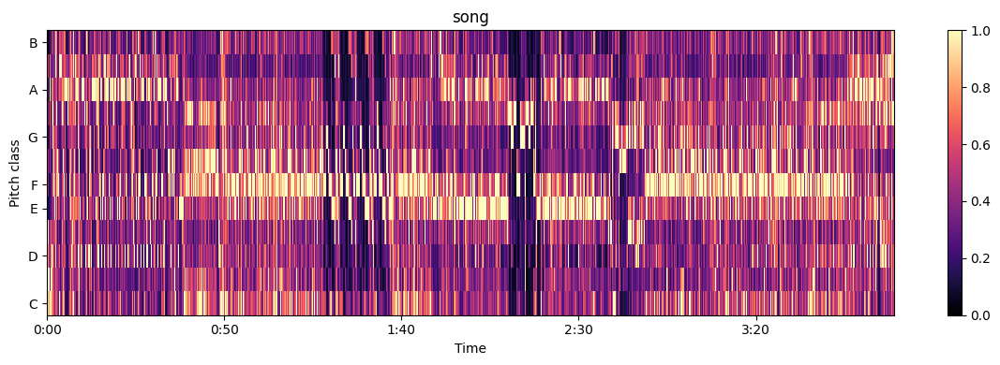

onmyside.mp3
[0. 0. 0. ... 0. 0. 0.]
[112.34714674]
C 	 0.361
C# 	 0.432
D 	 0.375
D# 	 0.498
E 	 0.499
F 	 0.481
F# 	 0.431
G 	 0.397
G# 	 0.343
A 	 0.393
A# 	 1.000
B 	 0.654
likely key: A# minor, correlation: 0.575
also possible: A# major, correlation: 0.562
C major 	 -0.368
C# major 	 -0.060
D major 	 -0.305
D# major 	  0.307
E major 	  0.002
F major 	  0.034
F# major 	  0.290
G major 	 -0.267
G# major 	 -0.152
A major 	 -0.260
A# major 	  0.562
B major 	  0.216
C minor 	 -0.206
C# minor 	 -0.241
D minor 	 -0.052
D# minor 	  0.394
E minor 	 -0.122
F minor 	 -0.168
F# minor 	 -0.305
G minor 	  0.247
G# minor 	  0.113
A minor 	 -0.319
A# minor 	  0.575
B minor 	  0.085


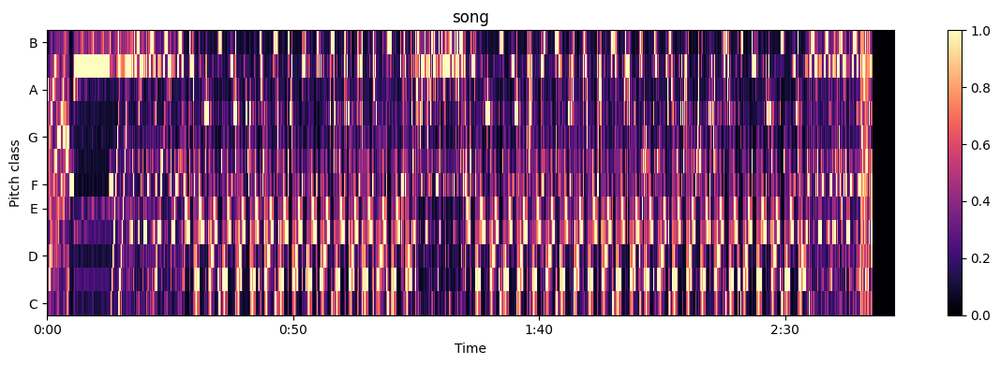

mindplay.mp3


/Users/kirtisubramanian/Library/Python/3.9/lib/python/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


[0. 0. 0. ... 0. 0. 0.]
[95.703125]
C 	 0.663
C# 	 0.689
D 	 0.709
D# 	 1.000
E 	 0.775
F 	 0.475
F# 	 0.472
G 	 0.587
G# 	 0.812
A 	 0.713
A# 	 0.745
B 	 0.833
likely key: G# minor, correlation: 0.623
C major 	 -0.340
C# major 	 -0.144
D major 	 -0.196
D# major 	  0.425
E major 	  0.353
F major 	 -0.476
F# major 	 -0.138
G major 	 -0.139
G# major 	  0.385
A major 	  0.059
A# major 	 -0.092
B major 	  0.304
C minor 	  0.227
C# minor 	  0.251
D minor 	 -0.315
D# minor 	  0.294
E minor 	  0.039
F minor 	 -0.266
F# minor 	 -0.371
G minor 	 -0.123
G# minor 	  0.623
A minor 	 -0.107
A# minor 	 -0.206
B minor 	 -0.046


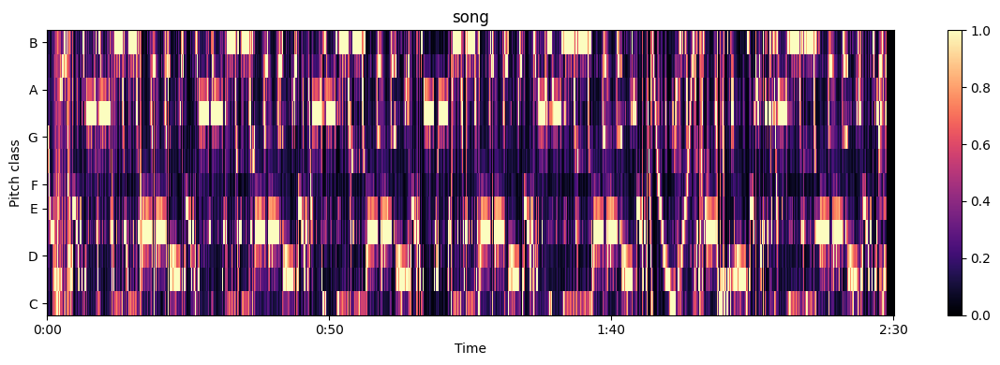

furelise.mp3
[0. 0. 0. ... 0. 0. 0.]
[151.99908088]
C 	 0.496
C# 	 0.206
D 	 0.291
D# 	 0.395
E 	 1.000
F 	 0.430
F# 	 0.111
G 	 0.100
G# 	 0.264
A 	 0.885
A# 	 0.404
B 	 0.589
likely key: A minor, correlation: 0.735
C major 	  0.236
C# major 	 -0.494
D major 	  0.051
D# major 	 -0.279
E major 	  0.616
F major 	  0.211
F# major 	 -0.473
G major 	 -0.053
G# major 	 -0.312
A major 	  0.592
A# major 	 -0.122
B major 	  0.027
C minor 	 -0.219
C# minor 	  0.225
D minor 	  0.153
D# minor 	 -0.333
E minor 	  0.433
F minor 	 -0.192
F# minor 	 -0.061
G minor 	 -0.352
G# minor 	 -0.024
A minor 	  0.735
A# minor 	 -0.284
B minor 	 -0.083


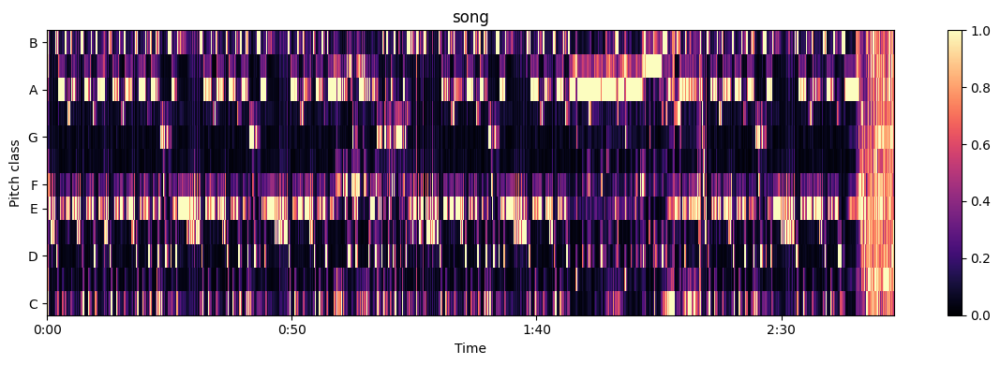

london-Copy1.mp3
[0. 0. 0. ... 0. 0. 0.]
[129.19921875]
C 	 0.390
C# 	 0.413
D 	 1.000
D# 	 0.766
E 	 0.342
F 	 0.487
F# 	 0.395
G 	 0.515
G# 	 0.551
A 	 0.790
A# 	 0.665
B 	 0.369
likely key: D minor, correlation: 0.608
C major 	 -0.219
C# major 	 -0.255
D major 	  0.486
D# major 	  0.352
E major 	 -0.423
F major 	  0.099
F# major 	 -0.311
G major 	  0.101
G# major 	  0.014
A major 	  0.133
A# major 	  0.454
B major 	 -0.431
C minor 	  0.072
C# minor 	 -0.354
D minor 	  0.608
D# minor 	  0.121
E minor 	 -0.387
F minor 	 -0.256
F# minor 	 -0.003
G minor 	  0.471
G# minor 	 -0.213
A minor 	  0.012
A# minor 	 -0.076
B minor 	  0.006


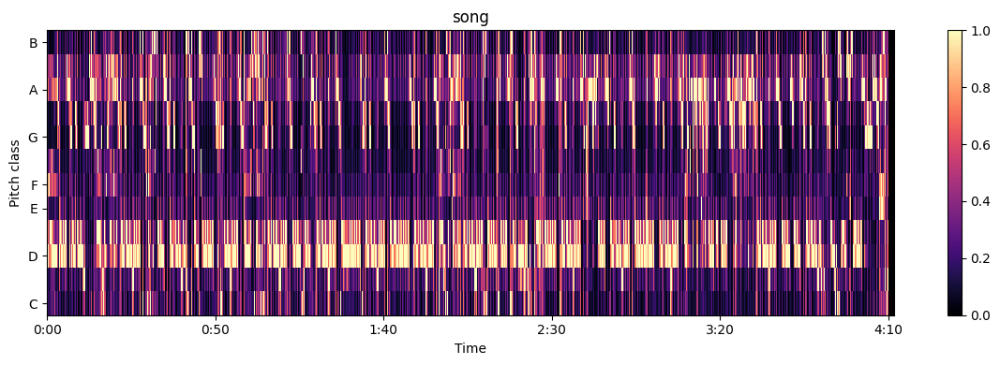

alive.mp3


/Users/kirtisubramanian/Library/Python/3.9/lib/python/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


[ 0.0000000e+00  0.0000000e+00  0.0000000e+00 ...  9.3197650e-06
 -6.5370969e-04 -9.6699846e-04]
[107.66601562]
C 	 0.202
C# 	 0.288
D 	 1.000
D# 	 0.699
E 	 0.248
F 	 0.150
F# 	 0.313
G 	 0.627
G# 	 0.335
A 	 0.615
A# 	 0.325
B 	 0.359
likely key: D major, correlation: 0.686
C major 	 -0.101
C# major 	 -0.434
D major 	  0.686
D# major 	  0.209
E major 	 -0.278
F major 	 -0.198
F# major 	 -0.314
G major 	  0.491
G# major 	 -0.172
A major 	  0.186
A# major 	  0.135
B major 	 -0.210
C minor 	  0.105
C# minor 	 -0.302
D minor 	  0.416
D# minor 	  0.055
E minor 	  0.002
F minor 	 -0.531
F# minor 	  0.049
G minor 	  0.513
G# minor 	 -0.142
A minor 	 -0.061
A# minor 	 -0.435
B minor 	  0.331


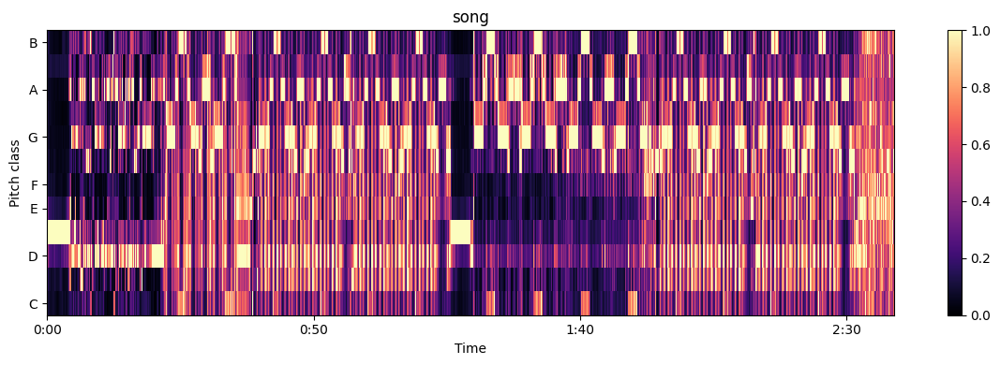

bheegibheegi.mp3
[-1.8846608e-15 -2.9929185e-15 -2.7205843e-15 ...  0.0000000e+00
  0.0000000e+00  0.0000000e+00]
[103.359375]
C 	 0.656
C# 	 0.308
D 	 0.722
D# 	 0.424
E 	 0.855
F 	 0.629
F# 	 0.532
G 	 1.000
G# 	 0.455
A 	 0.746
A# 	 0.398
B 	 0.784
likely key: G major, correlation: 0.828
also possible: E minor, correlation: 0.815
C major 	  0.677
C# major 	 -0.790
D major 	  0.488
D# major 	 -0.291
E major 	  0.182
F major 	  0.219
F# major 	 -0.655
G major 	  0.828
G# major 	 -0.594
A major 	  0.196
A# major 	 -0.145
B major 	 -0.115
C minor 	  0.046
C# minor 	 -0.335
D minor 	  0.262
D# minor 	 -0.584
E minor 	  0.815
F minor 	 -0.266
F# minor 	 -0.143
G minor 	  0.292
G# minor 	 -0.244
A minor 	  0.520
A# minor 	 -0.741
B minor 	  0.377


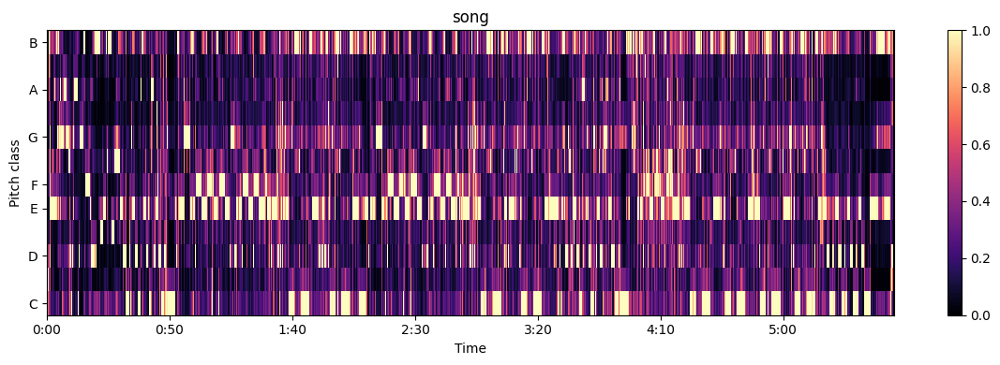

happy.mp3
[0. 0. 0. ... 0. 0. 0.]
[161.49902344]
C 	 0.501
C# 	 0.440
D 	 0.490
D# 	 0.668
E 	 0.694
F 	 1.000
F# 	 0.550
G 	 0.420
G# 	 0.534
A 	 0.532
A# 	 0.644
B 	 0.535
likely key: F major, correlation: 0.514
also possible: F minor, correlation: 0.51
C major 	 -0.020
C# major 	  0.078
D major 	 -0.403
D# major 	  0.169
E major 	 -0.048
F major 	  0.514
F# major 	 -0.106
G major 	 -0.503
G# major 	  0.063
A major 	 -0.195
A# major 	  0.472
B major 	 -0.021
C minor 	 -0.094
C# minor 	 -0.214
D minor 	  0.284
D# minor 	  0.223
E minor 	 -0.169
F minor 	  0.510
F# minor 	 -0.234
G minor 	 -0.171
G# minor 	 -0.072
A minor 	  0.049
A# minor 	  0.280
B minor 	 -0.393


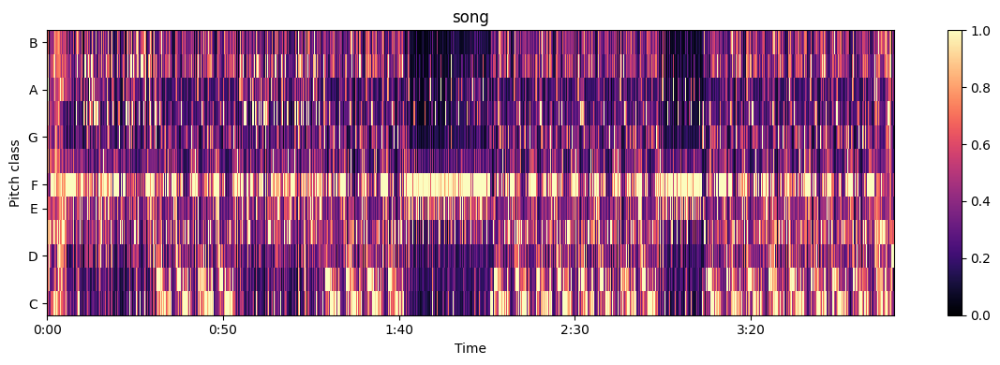

flyingwhales.mp3


/Users/kirtisubramanian/Library/Python/3.9/lib/python/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


[ 0.0000000e+00  0.0000000e+00  0.0000000e+00 ... -2.4702233e-05
 -1.9526029e-05 -2.0491343e-05]
[95.703125]
C 	 0.710
C# 	 0.624
D 	 0.823
D# 	 1.000
E 	 0.487
F 	 0.344
F# 	 0.271
G 	 0.616
G# 	 0.544
A 	 0.305
A# 	 0.641
B 	 0.462
likely key: D# major, correlation: 0.644
also possible: C minor, correlation: 0.633
C major 	 -0.015
C# major 	 -0.062
D major 	 -0.165
D# major 	  0.644
E major 	 -0.368
F major 	 -0.183
F# major 	 -0.198
G major 	  0.134
G# major 	  0.452
A major 	 -0.387
A# major 	  0.316
B major 	 -0.166
C minor 	  0.633
C# minor 	 -0.104
D minor 	 -0.005
D# minor 	  0.268
E minor 	 -0.110
F minor 	 -0.050
F# minor 	 -0.579
G minor 	  0.371
G# minor 	  0.102
A minor 	 -0.339
A# minor 	 -0.038
B minor 	 -0.149


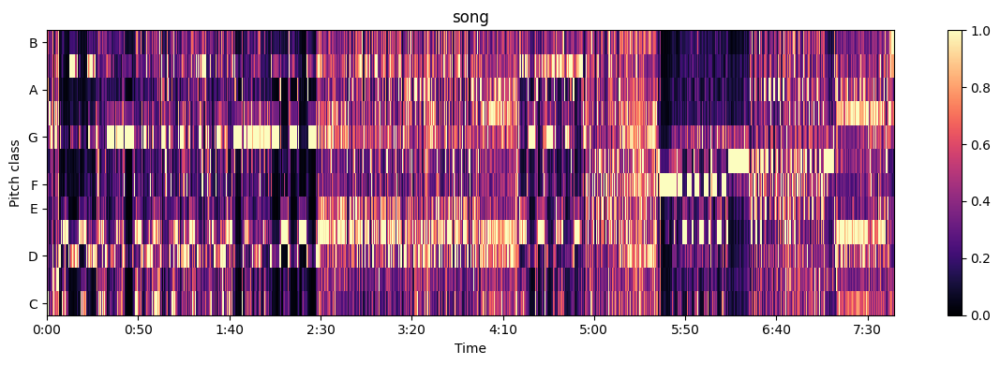

tu.mp3
[ 0.0000000e+00  0.0000000e+00  0.0000000e+00 ...  1.7235362e-07
  2.3691280e-08 -3.0887408e-09]
[117.45383523]
C 	 0.560
C# 	 0.516
D 	 0.739
D# 	 0.445
E 	 0.535
F 	 0.684
F# 	 0.433
G 	 1.000
G# 	 0.631
A 	 0.829
A# 	 0.473
B 	 0.296
likely key: G minor, correlation: 0.557
also possible: D minor, correlation: 0.516
C major 	  0.480
C# major 	 -0.208
D major 	  0.402
D# major 	  0.040
E major 	 -0.365
F major 	  0.394
F# major 	 -0.641
G major 	  0.510
G# major 	 -0.102
A major 	  0.103
A# major 	  0.152
B major 	 -0.766
C minor 	  0.137
C# minor 	 -0.240
D minor 	  0.516
D# minor 	 -0.611
E minor 	  0.119
F minor 	  0.148
F# minor 	 -0.057
G minor 	  0.557
G# minor 	 -0.451
A minor 	  0.363
A# minor 	 -0.274
B minor 	 -0.209


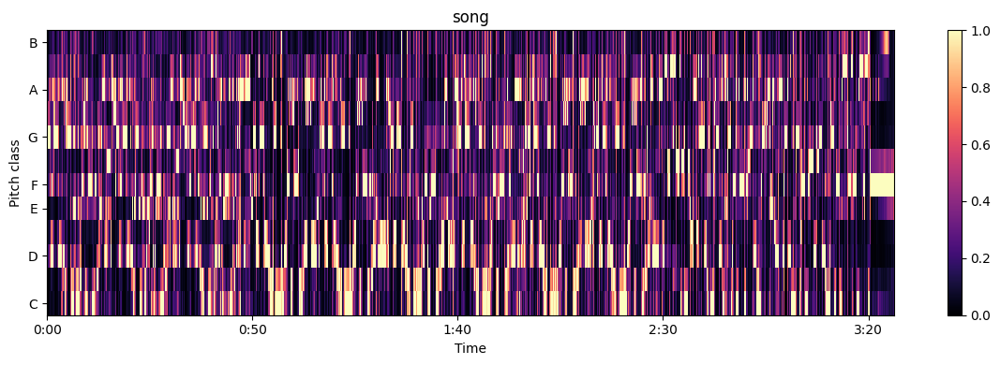

chanel-Copy1.mp3


/Users/kirtisubramanian/Library/Python/3.9/lib/python/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


[0.         0.         0.         ... 0.00013674 0.00012    0.00012366]
[107.66601562]
C 	 0.191
C# 	 0.315
D 	 0.546
D# 	 0.335
E 	 0.172
F 	 0.298
F# 	 0.733
G 	 1.000
G# 	 0.820
A 	 0.597
A# 	 0.282
B 	 0.335
likely key: D major, correlation: 0.421
C major 	 -0.058
C# major 	  0.014
D major 	  0.421
D# major 	  0.043
E major 	 -0.165
F major 	 -0.271
F# major 	  0.012
G major 	  0.368
G# major 	  0.004
A major 	 -0.040
A# major 	 -0.231
B major 	 -0.095
C minor 	 -0.028
C# minor 	 -0.181
D minor 	 -0.080
D# minor 	 -0.086
E minor 	  0.008
F minor 	 -0.109
F# minor 	  0.295
G minor 	  0.378
G# minor 	  0.117
A minor 	 -0.171
A# minor 	 -0.315
B minor 	  0.171


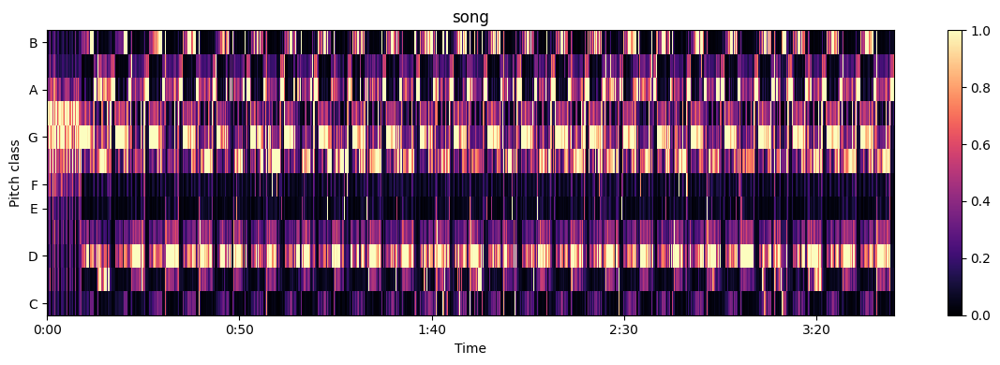

love&war.mp3
[-4.6639165e-24  6.3959687e-24 -8.2023753e-24 ...  5.3228036e-04
  5.8652525e-04  7.0715463e-04]
[95.703125]
C 	 0.182
C# 	 0.963
D 	 1.000
D# 	 0.269
E 	 0.168
F 	 0.162
F# 	 0.823
G 	 0.613
G# 	 0.195
A 	 0.570
A# 	 0.278
B 	 0.315
likely key: D major, correlation: 0.688
also possible: F# minor, correlation: 0.64
C major 	 -0.243
C# major 	  0.139
D major 	  0.688
D# major 	 -0.400
E major 	 -0.220
F major 	 -0.302
F# major 	  0.324
G major 	  0.304
G# major 	 -0.383
A major 	  0.365
A# major 	 -0.194
B major 	 -0.079
C minor 	 -0.376
C# minor 	  0.127
D minor 	  0.257
D# minor 	 -0.049
E minor 	 -0.147
F minor 	 -0.477
F# minor 	  0.640
G minor 	  0.163
G# minor 	 -0.381
A minor 	 -0.250
A# minor 	  0.003
B minor 	  0.489


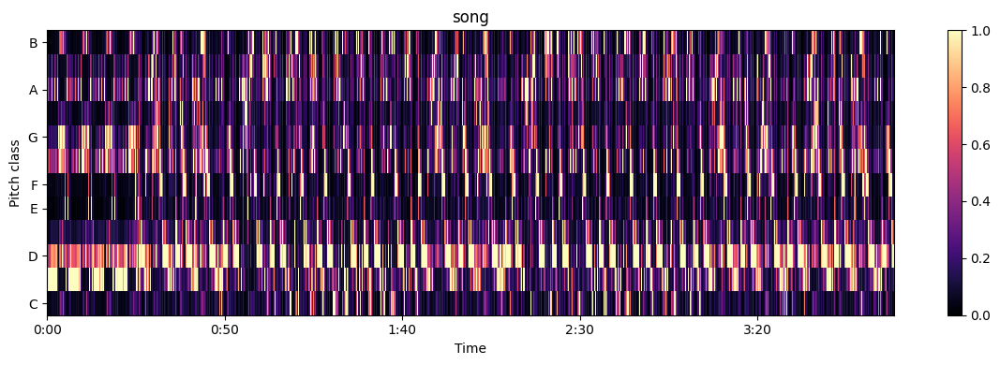

ungrateful.mp3
[-5.3871702e-15 -8.3649044e-15 -7.7901044e-15 ... -4.2465257e-07
  1.7114604e-06 -1.2635832e-06]
[129.19921875]
C 	 0.601
C# 	 1.000
D 	 0.459
D# 	 0.389
E 	 0.303
F 	 0.239
F# 	 0.237
G 	 0.426
G# 	 0.399
A 	 0.240
A# 	 0.165
B 	 0.120
likely key: C# minor, correlation: 0.546
also possible: C# major, correlation: 0.532
C major 	  0.080
C# major 	  0.532
D major 	 -0.124
D# major 	 -0.104
E major 	 -0.183
F major 	 -0.147
F# major 	  0.082
G major 	  0.008
G# major 	  0.361
A major 	  0.041
A# major 	 -0.253
B major 	 -0.293
C minor 	  0.201
C# minor 	  0.546
D minor 	 -0.080
D# minor 	 -0.251
E minor 	 -0.182
F minor 	  0.207
F# minor 	  0.041
G minor 	 -0.132
G# minor 	 -0.154
A minor 	 -0.139
A# minor 	  0.169
B minor 	 -0.226


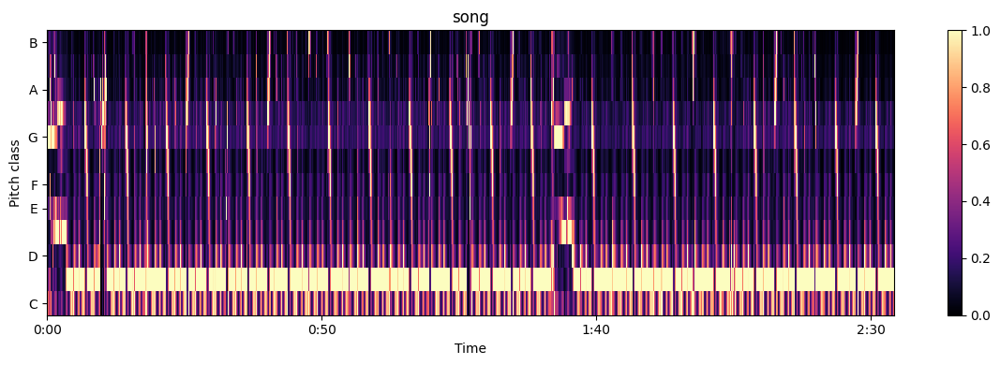

likely key: C# major, correlation: 0.518
also possible: C# minor, correlation: 0.512
C major 	  0.086
C# major 	  0.518
D major 	 -0.117
D# major 	 -0.174
E major 	 -0.200
F major 	 -0.078
F# major 	  0.126
G major 	 -0.007
G# major 	  0.289
A major 	  0.048
A# major 	 -0.213
B major 	 -0.277
C minor 	  0.163
C# minor 	  0.512
D minor 	 -0.029
D# minor 	 -0.254
E minor 	 -0.212
F minor 	  0.193
F# minor 	  0.063
G minor 	 -0.168
G# minor 	 -0.222
A minor 	 -0.115
A# minor 	  0.233
B minor 	 -0.164


In [16]:
import librosa
import numpy as np
import matplotlib.pyplot as plt
import IPython.display as ipd
import librosa.display
from IPython.display import Audio
from scipy import stats
# Python program to explain os.listdir() method 
    
# importing os module 
import os
  
# Get the path of current working directory
path = os.getcwd()
path += "//Good Songs"
  
# Get the list of all files and directories
# in current working directory
songs_list = os.listdir(path)

#move the non-song item to end of list so that we can avoid using it for the data
songs_list.sort(key = 'librosapractice.ipynb'.__eq__)

# print the list
print(songs_list)


for song in songs_list:
    if song[-3:] == 'mp3':
        print(song)
        # load audio
        y, sr = librosa.load(path+"//"+song)
        Audio(data=y, rate=sr)
        print(y)
        # tempo
        onset_env = librosa.onset.onset_strength(y=y, sr=sr)
        tempo = librosa.beat.tempo(onset_envelope=onset_env, sr=sr)
        print(tempo)
        # key
        onset_env = librosa.onset.onset_strength(y=y, sr=sr)
        tempo = librosa.beat.tempo(onset_envelope=onset_env, sr=sr)
        tempo


        y_harmonic, y_percussive = librosa.effects.hpss(y)

        song_tonal_analysis = Tonal_Fragment(y_harmonic, sr, tend=22)
        song_tonal_analysis.print_chroma()
        song_tonal_analysis.print_key()
        song_tonal_analysis.corr_table()
        song_tonal_analysis.chromagram("song")

        unebarque_e_min = Tonal_Fragment(y_harmonic, sr, tstart=0)
unebarque_e_min.print_key()
unebarque_e_min.corr_table()

reflections.mp3
[0. 0. 0. ... 0. 0. 0.]
C 	 0.743
C# 	 0.367
D 	 0.518
D# 	 0.295
E 	 0.660
F 	 0.423
F# 	 0.205
G 	 0.521
G# 	 0.331
A 	 1.000
A# 	 0.537
B 	 0.408
likely key: A minor, correlation: 0.899
C major 	  0.567
C# major 	 -0.543
D major 	  0.282
D# major 	 -0.207
E major 	  0.096
F major 	  0.508
F# major 	 -0.671
G major 	  0.307
G# major 	 -0.342
A major 	  0.497
A# major 	  0.065
B major 	 -0.559
C minor 	  0.038
C# minor 	 -0.042
D minor 	  0.422
D# minor 	 -0.672
E minor 	  0.295
F minor 	 -0.156
F# minor 	 -0.061
G minor 	  0.137
G# minor 	 -0.475
A minor 	  0.899
A# minor 	 -0.219
B minor 	 -0.165


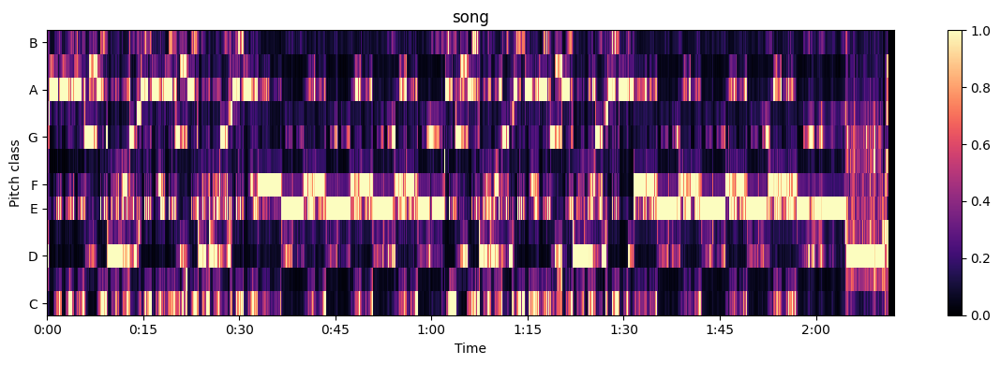

moonlightsonata.mp3


/Users/kirtisubramanian/Library/Python/3.9/lib/python/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


[ 0.          0.          0.         ... -0.00130089 -0.00109478
 -0.00098484]
C 	 0.194
C# 	 0.687
D 	 0.381
D# 	 0.293
E 	 0.699
F 	 0.322
F# 	 0.511
G 	 0.276
G# 	 1.000
A 	 0.650
A# 	 0.163
B 	 0.196
likely key: C# minor, correlation: 0.756
C major 	 -0.298
C# major 	  0.447
D major 	  0.089
D# major 	 -0.354
E major 	  0.535
F major 	 -0.395
F# major 	  0.060
G major 	 -0.331
G# major 	  0.282
A major 	  0.527
A# major 	 -0.597
B major 	  0.035
C minor 	 -0.427
C# minor 	  0.756
D minor 	 -0.174
D# minor 	 -0.241
E minor 	 -0.084
F minor 	  0.136
F# minor 	  0.460
G minor 	 -0.531
G# minor 	  0.373
A minor 	  0.087
A# minor 	 -0.139
B minor 	 -0.215


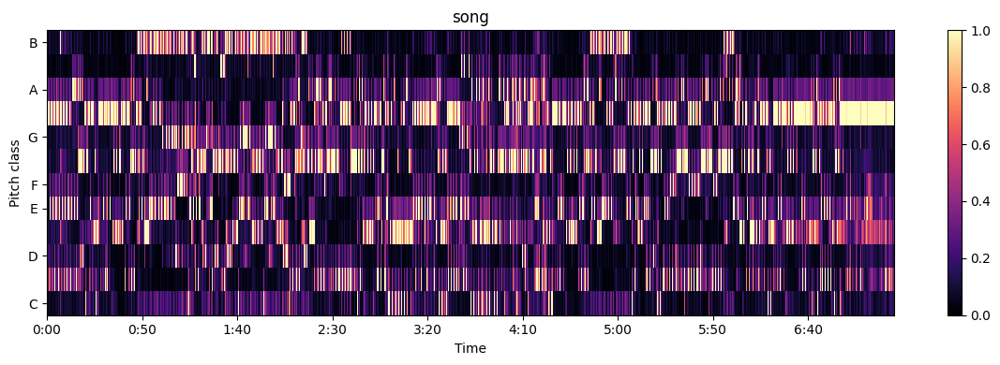

n95.mp3
[0. 0. 0. ... 0. 0. 0.]
C 	 0.993
C# 	 0.765
D 	 0.720
D# 	 0.602
E 	 0.782
F 	 1.000
F# 	 0.677
G 	 0.752
G# 	 0.713
A 	 0.861
A# 	 0.897
B 	 0.868
likely key: F major, correlation: 0.826
C major 	  0.513
C# major 	 -0.124
D major 	 -0.262
D# major 	 -0.190
E major 	 -0.150
F major 	  0.826
F# major 	 -0.294
G major 	 -0.009
G# major 	 -0.157
A major 	 -0.125
A# major 	  0.332
B major 	 -0.358
C minor 	  0.090
C# minor 	 -0.274
D minor 	  0.334
D# minor 	 -0.469
E minor 	 -0.027
F minor 	  0.432
F# minor 	 -0.281
G minor 	 -0.049
G# minor 	 -0.399
A minor 	  0.537
A# minor 	  0.281
B minor 	 -0.175


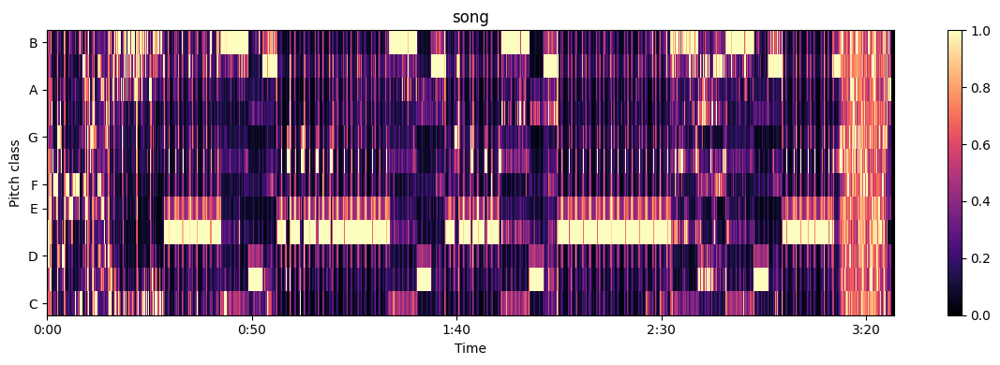

lolita-Copy1.mp3
[-4.6801439e-08 -5.5386405e-08 -4.5350479e-08 ... -4.5207052e-08
 -4.7819757e-08  1.1440590e-07]
C 	 1.000
C# 	 0.703
D 	 0.523
D# 	 0.371
E 	 0.278
F 	 0.330
F# 	 0.465
G 	 0.960
G# 	 0.540
A 	 0.274
A# 	 0.309
B 	 0.360
likely key: C minor, correlation: 0.614
also possible: C major, correlation: 0.564
C major 	  0.564
C# major 	  0.092
D major 	 -0.079
D# major 	  0.072
E major 	 -0.427
F major 	  0.068
F# major 	 -0.133
G major 	  0.499
G# major 	  0.236
A major 	 -0.391
A# major 	 -0.145
B major 	 -0.357
C minor 	  0.614
C# minor 	 -0.067
D minor 	 -0.172
D# minor 	 -0.363
E minor 	  0.128
F minor 	  0.220
F# minor 	 -0.231
G minor 	  0.301
G# minor 	 -0.219
A minor 	 -0.013
A# minor 	 -0.119
B minor 	 -0.079


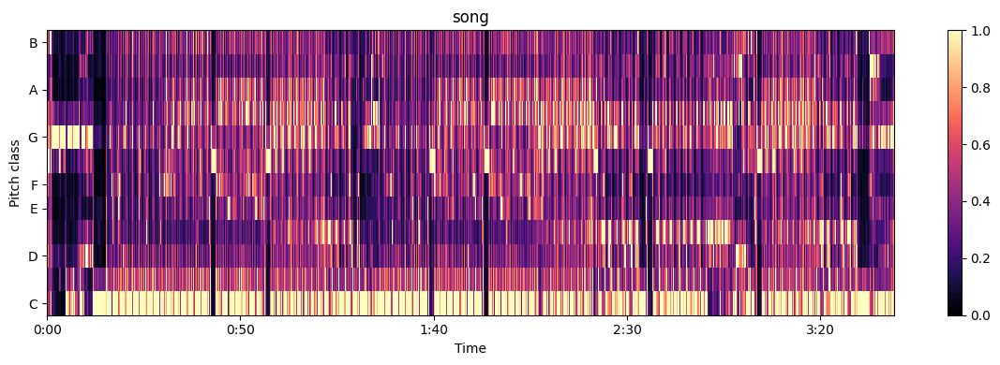

nightcoffee.mp3


/Users/kirtisubramanian/Library/Python/3.9/lib/python/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


[ 0.0000000e+00  0.0000000e+00  0.0000000e+00 ... -6.5336012e-09
  6.8059332e-09 -6.2961805e-09]
C 	 0.656
C# 	 0.214
D 	 0.637
D# 	 0.274
E 	 0.334
F 	 0.158
F# 	 0.337
G 	 1.000
G# 	 0.392
A 	 0.412
A# 	 0.189
B 	 0.694
likely key: G major, correlation: 0.93
C major 	  0.563
C# major 	 -0.585
D major 	  0.419
D# major 	 -0.065
E major 	 -0.106
F major 	 -0.037
F# major 	 -0.428
G major 	  0.930
G# major 	 -0.261
A major 	 -0.127
A# major 	 -0.216
B major 	 -0.087
C minor 	  0.393
C# minor 	 -0.379
D minor 	 -0.002
D# minor 	 -0.433
E minor 	  0.561
F minor 	 -0.285
F# minor 	 -0.215
G minor 	  0.438
G# minor 	 -0.069
A minor 	  0.191
A# minor 	 -0.671
B minor 	  0.471


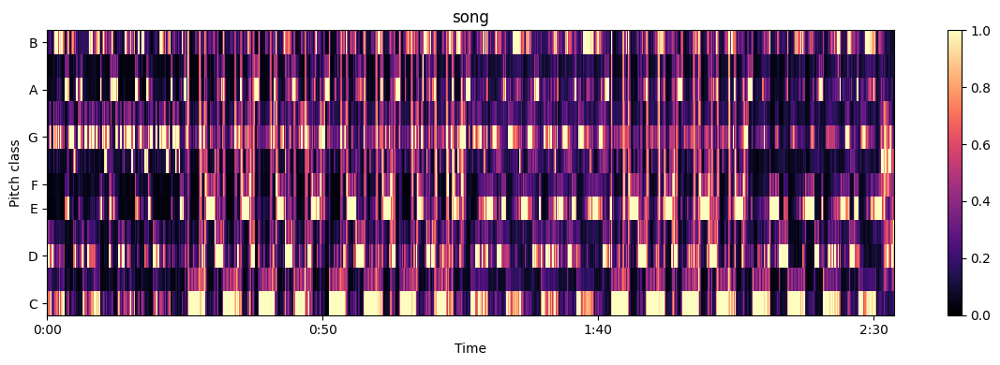

spring-Copy1.mp3
[ 0.0000000e+00  0.0000000e+00  0.0000000e+00 ...  1.1392290e-11
  5.1207202e-11 -3.7205884e-11]
C 	 0.593
C# 	 0.178
D 	 0.202
D# 	 0.218
E 	 0.703
F 	 1.000
F# 	 0.272
G 	 0.297
G# 	 0.289
A 	 0.389
A# 	 0.214
B 	 0.348
likely key: F major, correlation: 0.691
C major 	  0.551
C# major 	 -0.122
D major 	 -0.282
D# major 	 -0.207
E major 	  0.087
F major 	  0.691
F# major 	 -0.421
G major 	 -0.105
G# major 	 -0.093
A major 	 -0.037
A# major 	  0.135
B major 	 -0.198
C minor 	  0.044
C# minor 	 -0.112
D minor 	  0.285
D# minor 	 -0.358
E minor 	  0.231
F minor 	  0.570
F# minor 	 -0.233
G minor 	 -0.271
G# minor 	 -0.269
A minor 	  0.511
A# minor 	 -0.061
B minor 	 -0.338


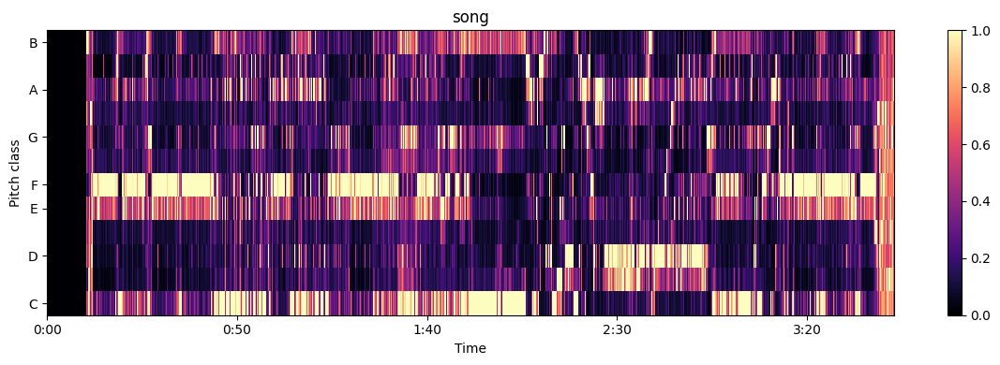

yours.mp3
[ 0.0000000e+00  0.0000000e+00  0.0000000e+00 ... -3.6860119e-08
 -4.2679218e-08  3.3192464e-07]
C 	 0.463
C# 	 0.493
D 	 0.983
D# 	 0.546
E 	 1.000
F 	 0.764
F# 	 0.989
G 	 0.677
G# 	 0.357
A 	 0.786
A# 	 0.491
B 	 0.760
likely key: D major, correlation: 0.707
C major 	  0.108
C# major 	 -0.518
D major 	  0.707
D# major 	 -0.569
E major 	  0.256
F major 	 -0.005
F# major 	 -0.077
G major 	  0.359
G# major 	 -0.824
A major 	  0.505
A# major 	 -0.128
B major 	  0.187
C minor 	 -0.524
C# minor 	 -0.140
D minor 	  0.405
D# minor 	 -0.098
E minor 	  0.479
F minor 	 -0.512
F# minor 	  0.458
G minor 	 -0.029
G# minor 	 -0.375
A minor 	  0.209
A# minor 	 -0.437
B minor 	  0.565


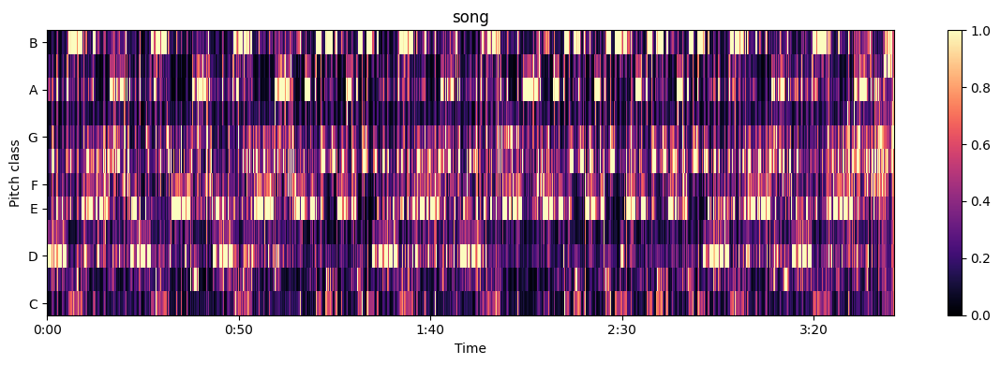

nortoncommander.mp3


/Users/kirtisubramanian/Library/Python/3.9/lib/python/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


[ 0.          0.          0.         ... -0.26482227 -0.2693093
 -0.28930312]
C 	 0.581
C# 	 0.915
D 	 0.554
D# 	 0.492
E 	 0.503
F 	 0.367
F# 	 0.320
G 	 0.325
G# 	 0.938
A 	 1.000
A# 	 0.598
B 	 0.566
likely key: C# minor, correlation: 0.592
C major 	 -0.301
C# major 	  0.337
D major 	  0.012
D# major 	 -0.179
E major 	  0.299
F major 	 -0.150
F# major 	 -0.030
G major 	 -0.318
G# major 	  0.324
A major 	  0.497
A# major 	 -0.330
B major 	 -0.161
C minor 	 -0.209
C# minor 	  0.592
D minor 	 -0.041
D# minor 	 -0.294
E minor 	 -0.369
F minor 	  0.031
F# minor 	  0.247
G minor 	 -0.390
G# minor 	  0.252
A minor 	  0.274
A# minor 	  0.116
B minor 	 -0.210


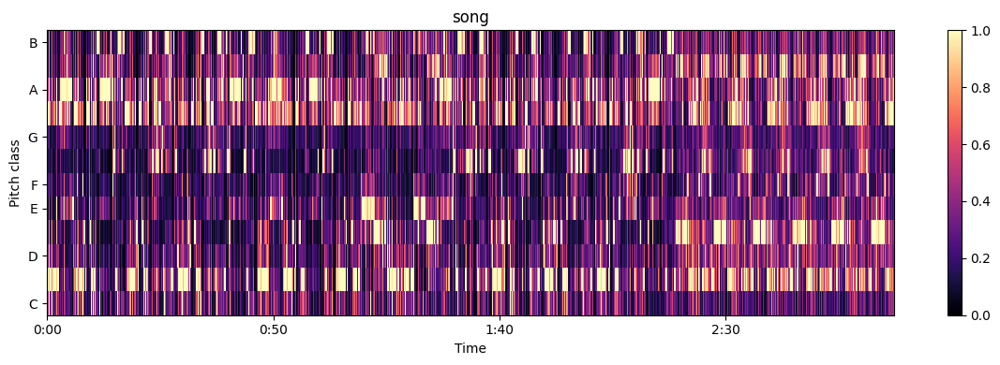

glimpseofus.mp3
[0. 0. 0. ... 0. 0. 0.]
C 	 0.577
C# 	 0.433
D 	 0.183
D# 	 0.441
E 	 0.302
F 	 0.890
F# 	 0.453
G 	 0.441
G# 	 1.000
A 	 0.445
A# 	 0.663
B 	 0.394
likely key: F minor, correlation: 0.836
C major 	 -0.092
C# major 	  0.543
D major 	 -0.646
D# major 	  0.330
E major 	 -0.175
F major 	  0.322
F# major 	  0.069
G major 	 -0.566
G# major 	  0.661
A major 	 -0.488
A# major 	  0.204
B major 	 -0.160
C minor 	  0.183
C# minor 	 -0.060
D minor 	 -0.163
D# minor 	  0.064
E minor 	 -0.523
F minor 	  0.836
F# minor 	 -0.237
G minor 	 -0.151
G# minor 	  0.321
A minor 	 -0.086
A# minor 	  0.421
B minor 	 -0.605


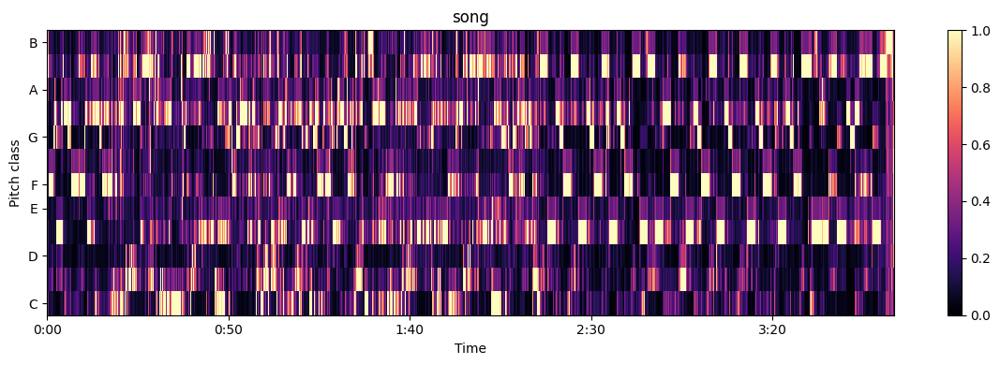

iknow.mp3
[ 0.0000000e+00  0.0000000e+00  0.0000000e+00 ... -6.9967004e-06
 -4.6506921e-06 -4.7812127e-06]
C 	 0.329
C# 	 0.568
D 	 0.418
D# 	 0.976
E 	 0.481
F 	 0.379
F# 	 0.641
G 	 0.390
G# 	 0.882
A 	 0.656
A# 	 1.000
B 	 0.758
likely key: D# minor, correlation: 0.693
also possible: G# minor, correlation: 0.658
C major 	 -0.778
C# major 	  0.223
D major 	 -0.311
D# major 	  0.500
E major 	  0.183
F major 	 -0.495
F# major 	  0.440
G major 	 -0.556
G# major 	  0.372
A major 	 -0.117
A# major 	  0.098
B major 	  0.442
C minor 	 -0.102
C# minor 	  0.097
D minor 	 -0.453
D# minor 	  0.693
E minor 	 -0.396
F minor 	 -0.193
F# minor 	 -0.030
G minor 	 -0.057
G# minor 	  0.658
A minor 	 -0.451
A# minor 	  0.323
B minor 	 -0.089


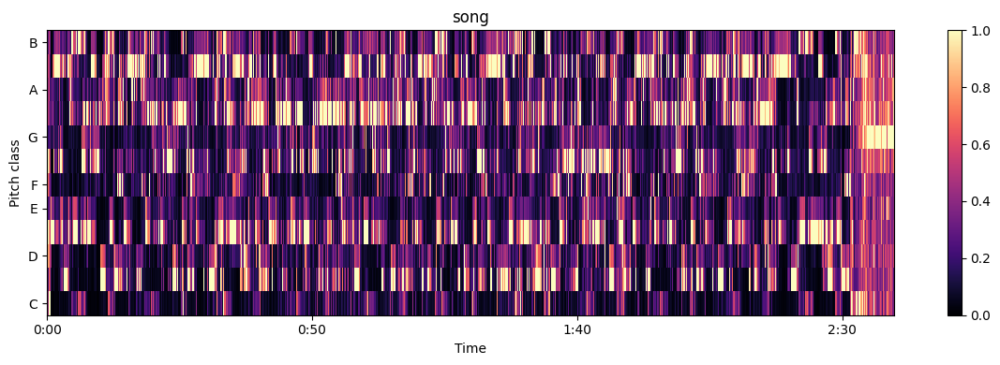

misstherage.mp3
[ 0.          0.          0.         ... -0.00024825  0.00073072
  0.00079551]
C 	 0.749
C# 	 0.713
D 	 0.658
D# 	 1.000
E 	 0.671
F 	 0.602
F# 	 0.499
G 	 0.671
G# 	 0.724
A 	 0.495
A# 	 0.525
B 	 0.371
likely key: G# major, correlation: 0.678
also possible: C minor, correlation: 0.627
C major 	  0.078
C# major 	  0.230
D major 	 -0.380
D# major 	  0.597
E major 	 -0.259
F major 	 -0.132
F# major 	 -0.212
G major 	 -0.152
G# major 	  0.678
A major 	 -0.293
A# major 	  0.089
B major 	 -0.243
C minor 	  0.627
C# minor 	  0.185
D minor 	 -0.154
D# minor 	  0.217
E minor 	 -0.122
F minor 	  0.301
F# minor 	 -0.416
G minor 	  0.093
G# minor 	  0.115
A minor 	 -0.199
A# minor 	 -0.051
B minor 	 -0.595


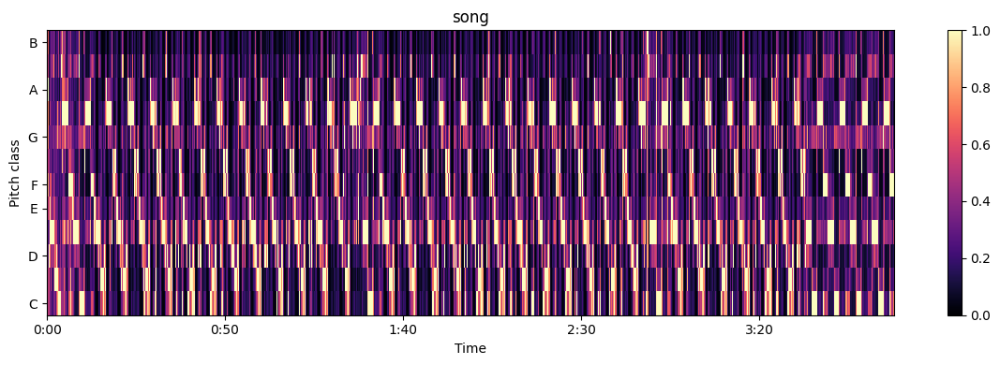

desertrose.mp3


[src/libmpg123/layer1.c:I_step_two():190] error: 250 bits needed, 204 available
[src/libmpg123/layer1.c:INT123_do_layer1():237] error: Aborting layer I decoding after step two.
[src/libmpg123/layer1.c:check_balloc():30] error: Illegal bit allocation value.
[src/libmpg123/layer1.c:INT123_do_layer1():228] error: Aborting layer I decoding after step one.
Note: Illegal Audio-MPEG-Header 0x1a8e8dbd at offset 5943.
Note: Trying to resync...
Note: Skipped 4 bytes in input.
[src/libmpg123/layer1.c:check_balloc():30] error: Illegal bit allocation value.
[src/libmpg123/layer1.c:INT123_do_layer1():228] error: Aborting layer I decoding after step one.
Note: Illegal Audio-MPEG-Header 0x80e76a6b at offset 6326.
Note: Trying to resync...
Note: Skipped 383 bytes in input.
[src/libmpg123/layer1.c:I_step_two():190] error: 243 bits needed, 179 available
[src/libmpg123/layer1.c:INT123_do_layer1():237] error: Aborting layer I decoding after step two.
Note: Illegal Audio-MPEG-Header 0x3840648a at offset 698

[ 0.0000000e+00  0.0000000e+00  0.0000000e+00 ... -2.9504423e-05
 -1.8075370e-05 -1.9269657e-05]
C 	 1.000
C# 	 0.814
D 	 0.339
D# 	 0.611
E 	 0.636
F 	 0.551
F# 	 0.449
G 	 0.903
G# 	 0.680
A 	 0.349
A# 	 0.433
B 	 0.412
likely key: C minor, correlation: 0.62
C major 	  0.540
C# major 	  0.264
D major 	 -0.511
D# major 	  0.195
E major 	 -0.165
F major 	  0.056
F# major 	 -0.168
G major 	  0.166
G# major 	  0.464
A major 	 -0.401
A# major 	 -0.177
B major 	 -0.264
C minor 	  0.620
C# minor 	  0.225
D minor 	 -0.394
D# minor 	 -0.303
E minor 	  0.212
F minor 	  0.465
F# minor 	 -0.427
G minor 	  0.056
G# minor 	 -0.010
A minor 	  0.012
A# minor 	 -0.003
B minor 	 -0.454


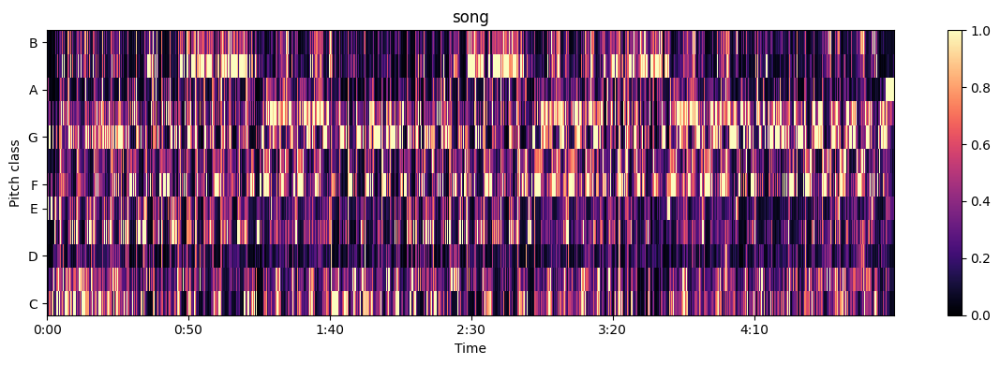

gymnopedie.mp3
[ 0.0000000e+00  0.0000000e+00  0.0000000e+00 ... -7.5406144e-09
  4.2799848e-09  3.4423262e-08]
C 	 0.159
C# 	 0.349
D 	 1.000
D# 	 0.404
E 	 0.130
F 	 0.108
F# 	 0.362
G 	 0.551
G# 	 0.214
A 	 0.370
A# 	 0.161
B 	 0.212
likely key: D major, correlation: 0.771
C major 	 -0.045
C# major 	 -0.270
D major 	  0.771
D# major 	 -0.027
E major 	 -0.366
F major 	 -0.182
F# major 	 -0.167
G major 	  0.559
G# major 	 -0.249
A major 	  0.163
A# major 	  0.062
B major 	 -0.247
C minor 	  0.011
C# minor 	 -0.245
D minor 	  0.478
D# minor 	 -0.053
E minor 	 -0.027
F minor 	 -0.455
F# minor 	  0.203
G minor 	  0.465
G# minor 	 -0.299
A minor 	 -0.162
A# minor 	 -0.365
B minor 	  0.450


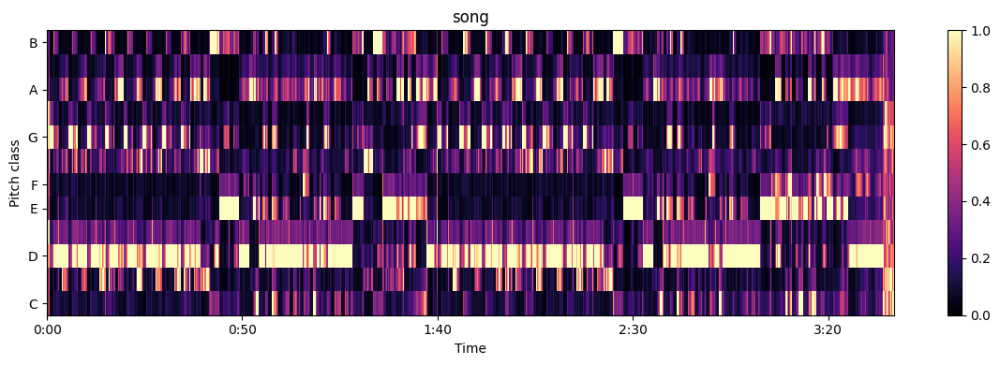

perhaps.mp3


/Users/kirtisubramanian/Library/Python/3.9/lib/python/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


[0. 0. 0. ... 0. 0. 0.]
C 	 0.773
C# 	 0.677
D 	 0.734
D# 	 0.629
E 	 1.000
F 	 0.790
F# 	 0.531
G 	 0.540
G# 	 0.538
A 	 0.917
A# 	 0.713
B 	 0.702
likely key: A minor, correlation: 0.738
C major 	  0.344
C# major 	 -0.413
D major 	  0.129
D# major 	 -0.375
E major 	  0.389
F major 	  0.432
F# major 	 -0.513
G major 	 -0.009
G# major 	 -0.403
A major 	  0.594
A# major 	  0.062
B major 	 -0.236
C minor 	 -0.257
C# minor 	  0.192
D minor 	  0.450
D# minor 	 -0.469
E minor 	  0.336
F minor 	 -0.091
F# minor 	 -0.044
G minor 	 -0.254
G# minor 	 -0.360
A minor 	  0.738
A# minor 	 -0.124
B minor 	 -0.118


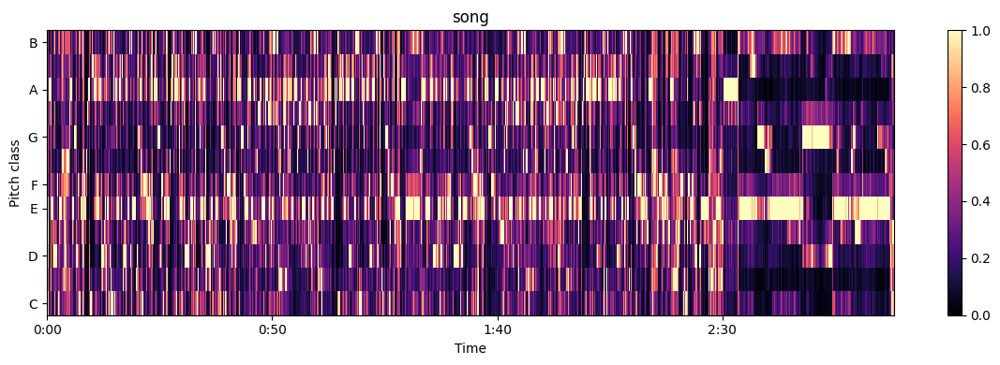

thefutureisnow.mp3


/Users/kirtisubramanian/Library/Python/3.9/lib/python/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


[ 0.0000000e+00  0.0000000e+00  0.0000000e+00 ... -3.8040228e-06
 -1.0471062e-05 -1.6640490e-05]
C 	 0.946
C# 	 0.666
D 	 1.000
D# 	 0.723
E 	 0.800
F 	 0.616
F# 	 0.304
G 	 0.402
G# 	 0.331
A 	 0.878
A# 	 0.559
B 	 0.582
likely key: A minor, correlation: 0.585
also possible: D minor, correlation: 0.561
C major 	  0.389
C# major 	 -0.439
D major 	  0.271
D# major 	 -0.141
E major 	 -0.060
F major 	  0.385
F# major 	 -0.552
G major 	  0.206
G# major 	 -0.198
A major 	  0.388
A# major 	  0.161
B major 	 -0.410
C minor 	  0.181
C# minor 	 -0.001
D minor 	  0.561
D# minor 	 -0.352
E minor 	  0.105
F minor 	 -0.172
F# minor 	 -0.145
G minor 	 -0.027
G# minor 	 -0.487
A minor 	  0.585
A# minor 	 -0.214
B minor 	 -0.035


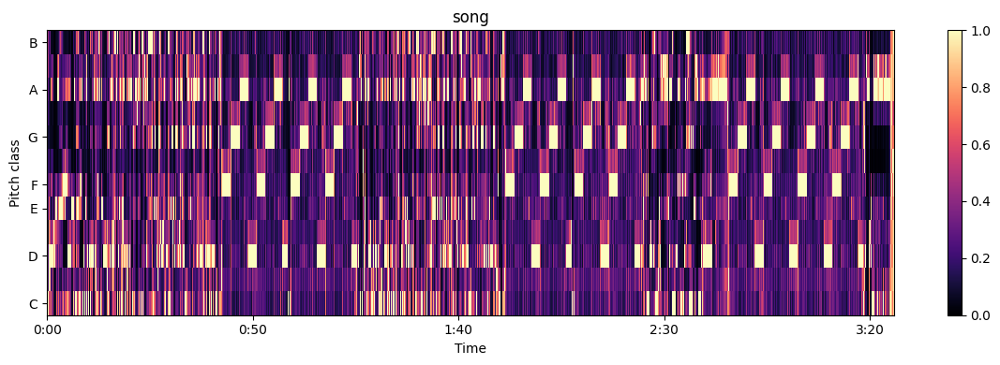

glow.mp3


/Users/kirtisubramanian/Library/Python/3.9/lib/python/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


[ 0.000000e+00  0.000000e+00  0.000000e+00 ... -3.228346e-05 -8.581824e-06
 -4.538208e-06]
C 	 0.096
C# 	 0.202
D 	 1.000
D# 	 0.413
E 	 0.434
F 	 0.255
F# 	 0.343
G 	 0.336
G# 	 0.191
A 	 0.657
A# 	 0.284
B 	 0.153
likely key: D major, correlation: 0.822
C major 	 -0.052
C# major 	 -0.453
D major 	  0.822
D# major 	 -0.132
E major 	 -0.114
F major 	  0.017
F# major 	 -0.354
G major 	  0.336
G# major 	 -0.424
A major 	  0.500
A# major 	  0.170
B major 	 -0.315
C minor 	 -0.252
C# minor 	 -0.184
D minor 	  0.703
D# minor 	 -0.117
E minor 	  0.030
F minor 	 -0.494
F# minor 	  0.278
G minor 	  0.314
G# minor 	 -0.393
A minor 	  0.186
A# minor 	 -0.360
B minor 	  0.289


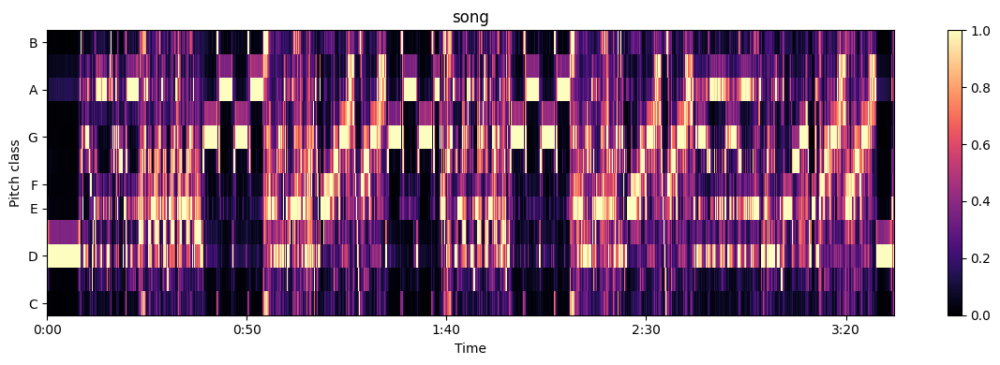

winterwonderland.mp3


/Users/kirtisubramanian/Library/Python/3.9/lib/python/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


[0. 0. 0. ... 0. 0. 0.]
C 	 0.384
C# 	 0.249
D 	 0.502
D# 	 0.274
E 	 0.254
F 	 0.314
F# 	 0.393
G 	 1.000
G# 	 0.442
A 	 0.437
A# 	 0.283
B 	 0.294
likely key: G major, correlation: 0.748
also possible: G minor, correlation: 0.689
C major 	  0.435
C# major 	 -0.303
D major 	  0.384
D# major 	  0.131
E major 	 -0.357
F major 	  0.057
F# major 	 -0.379
G major 	  0.748
G# major 	 -0.145
A major 	 -0.194
A# major 	  0.008
B major 	 -0.386
C minor 	  0.282
C# minor 	 -0.405
D minor 	  0.122
D# minor 	 -0.375
E minor 	  0.316
F minor 	 -0.071
F# minor 	 -0.116
G minor 	  0.689
G# minor 	 -0.206
A minor 	  0.035
A# minor 	 -0.404
B minor 	  0.133


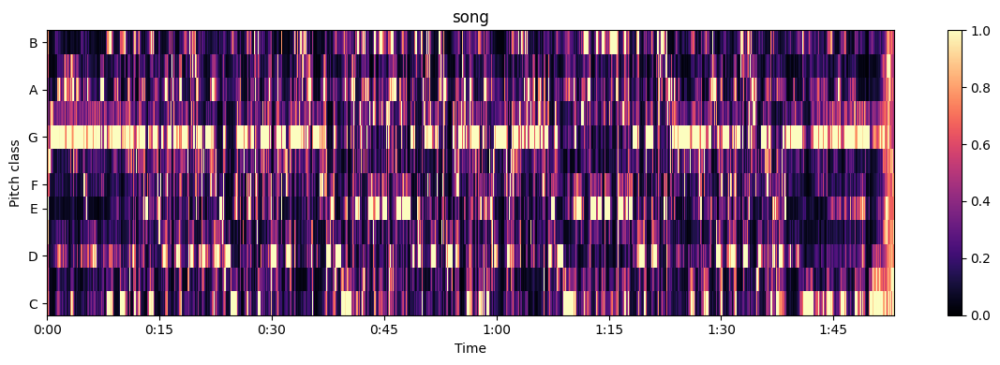

heaviestmatter.mp3


/Users/kirtisubramanian/Library/Python/3.9/lib/python/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


[ 0.0000000e+00  0.0000000e+00  0.0000000e+00 ...  5.3510735e-07
 -4.2405654e-07  3.1078420e-07]
C 	 0.659
C# 	 0.584
D 	 0.744
D# 	 0.607
E 	 0.745
F 	 0.735
F# 	 0.576
G 	 0.613
G# 	 0.691
A 	 1.000
A# 	 0.791
B 	 0.574
likely key: A minor, correlation: 0.674
C major 	  0.112
C# major 	 -0.310
D major 	  0.311
D# major 	 -0.087
E major 	  0.048
F major 	  0.484
F# major 	 -0.497
G major 	 -0.086
G# major 	 -0.229
A major 	  0.523
A# major 	  0.282
B major 	 -0.551
C minor 	 -0.262
C# minor 	 -0.076
D minor 	  0.594
D# minor 	 -0.390
E minor 	 -0.110
F minor 	 -0.054
F# minor 	  0.115
G minor 	  0.115
G# minor 	 -0.351
A minor 	  0.674
A# minor 	  0.019
B minor 	 -0.271


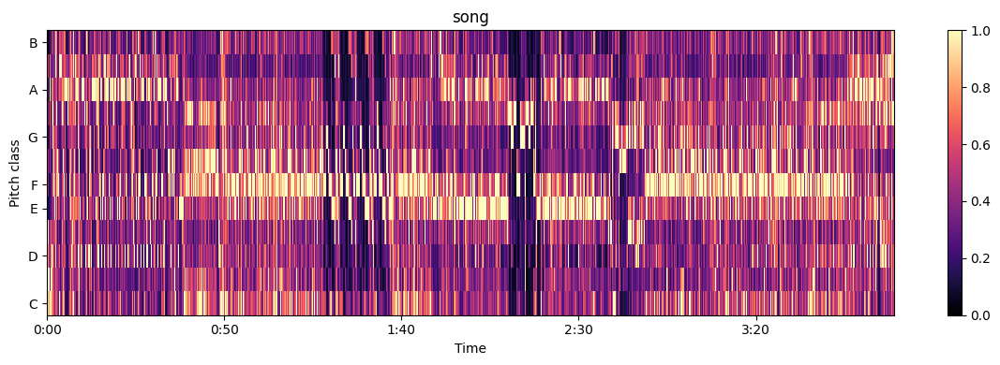

onmyside.mp3
[0. 0. 0. ... 0. 0. 0.]
C 	 0.361
C# 	 0.432
D 	 0.375
D# 	 0.498
E 	 0.499
F 	 0.481
F# 	 0.431
G 	 0.397
G# 	 0.343
A 	 0.393
A# 	 1.000
B 	 0.654
likely key: A# minor, correlation: 0.575
also possible: A# major, correlation: 0.562
C major 	 -0.368
C# major 	 -0.060
D major 	 -0.305
D# major 	  0.307
E major 	  0.002
F major 	  0.034
F# major 	  0.290
G major 	 -0.267
G# major 	 -0.152
A major 	 -0.260
A# major 	  0.562
B major 	  0.216
C minor 	 -0.206
C# minor 	 -0.241
D minor 	 -0.052
D# minor 	  0.394
E minor 	 -0.122
F minor 	 -0.168
F# minor 	 -0.305
G minor 	  0.247
G# minor 	  0.113
A minor 	 -0.319
A# minor 	  0.575
B minor 	  0.085


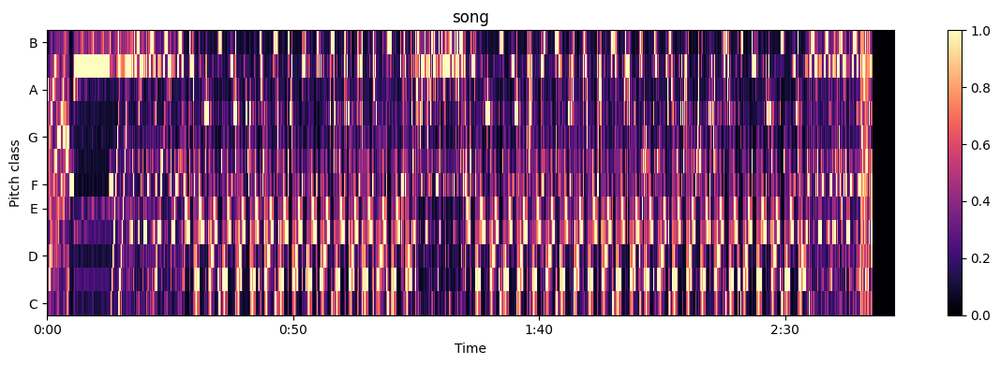

mindplay.mp3


/Users/kirtisubramanian/Library/Python/3.9/lib/python/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


[0. 0. 0. ... 0. 0. 0.]
C 	 0.663
C# 	 0.689
D 	 0.709
D# 	 1.000
E 	 0.775
F 	 0.475
F# 	 0.472
G 	 0.587
G# 	 0.812
A 	 0.713
A# 	 0.745
B 	 0.833
likely key: G# minor, correlation: 0.623
C major 	 -0.340
C# major 	 -0.144
D major 	 -0.196
D# major 	  0.425
E major 	  0.353
F major 	 -0.476
F# major 	 -0.138
G major 	 -0.139
G# major 	  0.385
A major 	  0.059
A# major 	 -0.092
B major 	  0.304
C minor 	  0.227
C# minor 	  0.251
D minor 	 -0.315
D# minor 	  0.294
E minor 	  0.039
F minor 	 -0.266
F# minor 	 -0.371
G minor 	 -0.123
G# minor 	  0.623
A minor 	 -0.107
A# minor 	 -0.206
B minor 	 -0.046


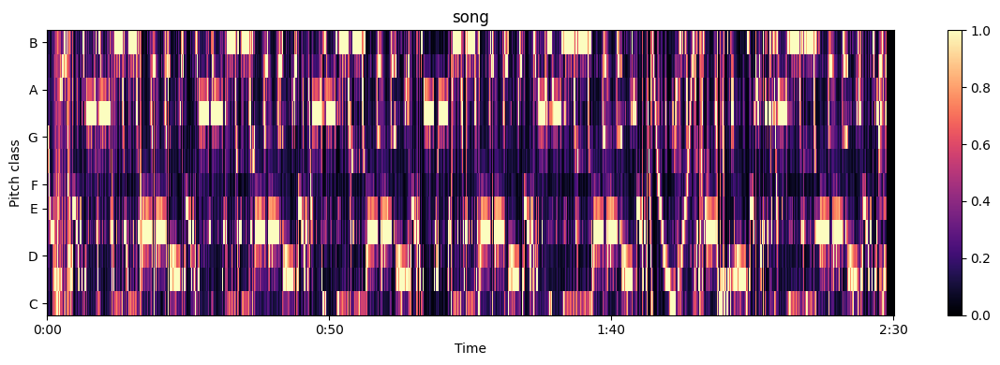

C 	 0.663
C# 	 0.689
D 	 0.709
D# 	 1.000
E 	 0.775
F 	 0.475
F# 	 0.472
G 	 0.587
G# 	 0.812
A 	 0.713
A# 	 0.745
B 	 0.833
likely key: G# minor, correlation: 0.623
C major 	 -0.340
C# major 	 -0.144
D major 	 -0.196
D# major 	  0.425
E major 	  0.353
F major 	 -0.476
F# major 	 -0.138
G major 	 -0.139
G# major 	  0.385
A major 	  0.059
A# major 	 -0.092
B major 	  0.304
C minor 	  0.227
C# minor 	  0.251
D minor 	 -0.315
D# minor 	  0.294
E minor 	  0.039
F minor 	 -0.266
F# minor 	 -0.371
G minor 	 -0.123
G# minor 	  0.623
A minor 	 -0.107
A# minor 	 -0.206
B minor 	 -0.046


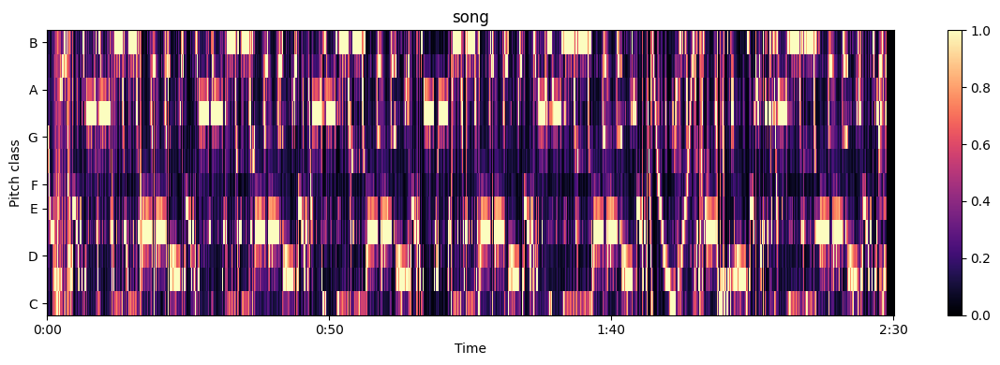

furelise.mp3
[0. 0. 0. ... 0. 0. 0.]
C 	 0.496
C# 	 0.206
D 	 0.291
D# 	 0.395
E 	 1.000
F 	 0.430
F# 	 0.111
G 	 0.100
G# 	 0.264
A 	 0.885
A# 	 0.404
B 	 0.589
likely key: A minor, correlation: 0.735
C major 	  0.236
C# major 	 -0.494
D major 	  0.051
D# major 	 -0.279
E major 	  0.616
F major 	  0.211
F# major 	 -0.473
G major 	 -0.053
G# major 	 -0.312
A major 	  0.592
A# major 	 -0.122
B major 	  0.027
C minor 	 -0.219
C# minor 	  0.225
D minor 	  0.153
D# minor 	 -0.333
E minor 	  0.433
F minor 	 -0.192
F# minor 	 -0.061
G minor 	 -0.352
G# minor 	 -0.024
A minor 	  0.735
A# minor 	 -0.284
B minor 	 -0.083


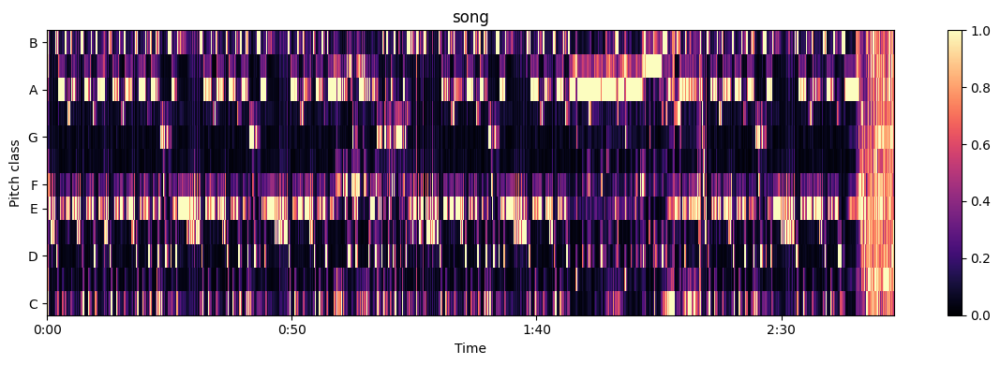

london-Copy1.mp3
[0. 0. 0. ... 0. 0. 0.]
C 	 0.390
C# 	 0.413
D 	 1.000
D# 	 0.766
E 	 0.342
F 	 0.487
F# 	 0.395
G 	 0.515
G# 	 0.551
A 	 0.790
A# 	 0.665
B 	 0.369
likely key: D minor, correlation: 0.608
C major 	 -0.219
C# major 	 -0.255
D major 	  0.486
D# major 	  0.352
E major 	 -0.423
F major 	  0.099
F# major 	 -0.311
G major 	  0.101
G# major 	  0.014
A major 	  0.133
A# major 	  0.454
B major 	 -0.431
C minor 	  0.072
C# minor 	 -0.354
D minor 	  0.608
D# minor 	  0.121
E minor 	 -0.387
F minor 	 -0.256
F# minor 	 -0.003
G minor 	  0.471
G# minor 	 -0.213
A minor 	  0.012
A# minor 	 -0.076
B minor 	  0.006


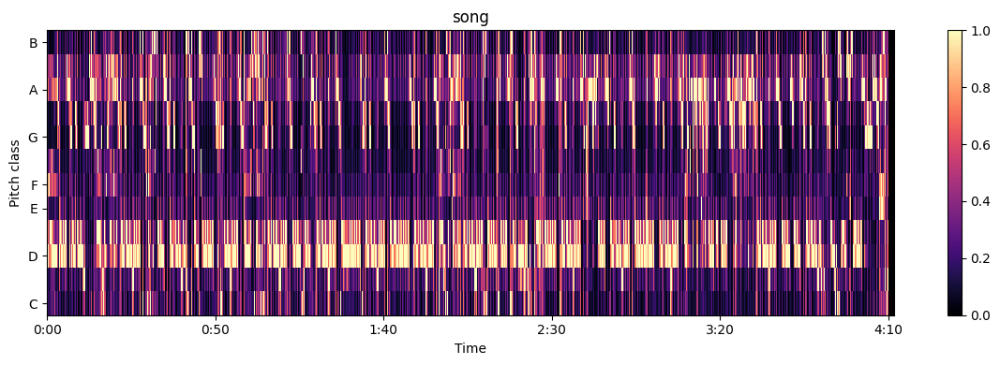

alive.mp3


/Users/kirtisubramanian/Library/Python/3.9/lib/python/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


[ 0.0000000e+00  0.0000000e+00  0.0000000e+00 ...  9.3197650e-06
 -6.5370969e-04 -9.6699846e-04]
C 	 0.202
C# 	 0.288
D 	 1.000
D# 	 0.699
E 	 0.248
F 	 0.150
F# 	 0.313
G 	 0.627
G# 	 0.335
A 	 0.615
A# 	 0.325
B 	 0.359
likely key: D major, correlation: 0.686
C major 	 -0.101
C# major 	 -0.434
D major 	  0.686
D# major 	  0.209
E major 	 -0.278
F major 	 -0.198
F# major 	 -0.314
G major 	  0.491
G# major 	 -0.172
A major 	  0.186
A# major 	  0.135
B major 	 -0.210
C minor 	  0.105
C# minor 	 -0.302
D minor 	  0.416
D# minor 	  0.055
E minor 	  0.002
F minor 	 -0.531
F# minor 	  0.049
G minor 	  0.513
G# minor 	 -0.142
A minor 	 -0.061
A# minor 	 -0.435
B minor 	  0.331


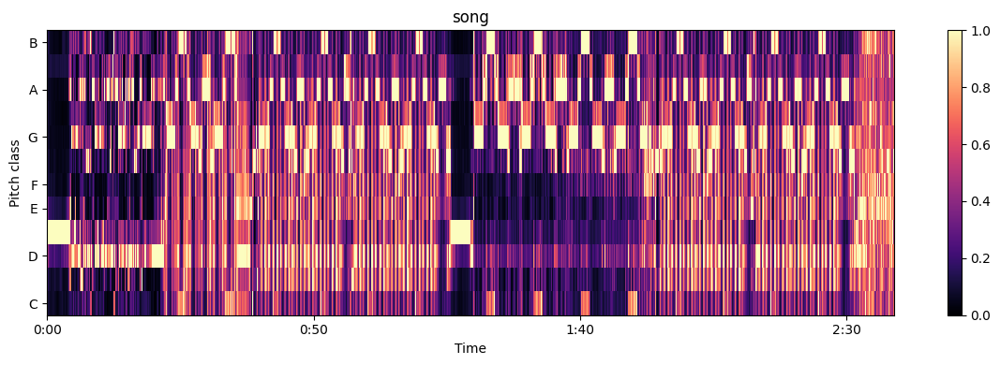

bheegibheegi.mp3
[-1.8846608e-15 -2.9929185e-15 -2.7205843e-15 ...  0.0000000e+00
  0.0000000e+00  0.0000000e+00]
C 	 0.656
C# 	 0.308
D 	 0.722
D# 	 0.424
E 	 0.855
F 	 0.629
F# 	 0.532
G 	 1.000
G# 	 0.455
A 	 0.746
A# 	 0.398
B 	 0.784
likely key: G major, correlation: 0.828
also possible: E minor, correlation: 0.815
C major 	  0.677
C# major 	 -0.790
D major 	  0.488
D# major 	 -0.291
E major 	  0.182
F major 	  0.219
F# major 	 -0.655
G major 	  0.828
G# major 	 -0.594
A major 	  0.196
A# major 	 -0.145
B major 	 -0.115
C minor 	  0.046
C# minor 	 -0.335
D minor 	  0.262
D# minor 	 -0.584
E minor 	  0.815
F minor 	 -0.266
F# minor 	 -0.143
G minor 	  0.292
G# minor 	 -0.244
A minor 	  0.520
A# minor 	 -0.741
B minor 	  0.377


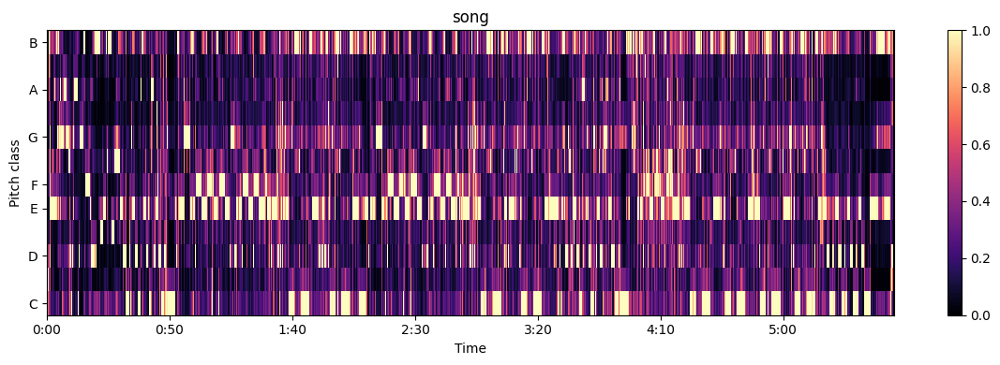

happy.mp3
[0. 0. 0. ... 0. 0. 0.]
C 	 0.501
C# 	 0.440
D 	 0.490
D# 	 0.668
E 	 0.694
F 	 1.000
F# 	 0.550
G 	 0.420
G# 	 0.534
A 	 0.532
A# 	 0.644
B 	 0.535
likely key: F major, correlation: 0.514
also possible: F minor, correlation: 0.51
C major 	 -0.020
C# major 	  0.078
D major 	 -0.403
D# major 	  0.169
E major 	 -0.048
F major 	  0.514
F# major 	 -0.106
G major 	 -0.503
G# major 	  0.063
A major 	 -0.195
A# major 	  0.472
B major 	 -0.021
C minor 	 -0.094
C# minor 	 -0.214
D minor 	  0.284
D# minor 	  0.223
E minor 	 -0.169
F minor 	  0.510
F# minor 	 -0.234
G minor 	 -0.171
G# minor 	 -0.072
A minor 	  0.049
A# minor 	  0.280
B minor 	 -0.393


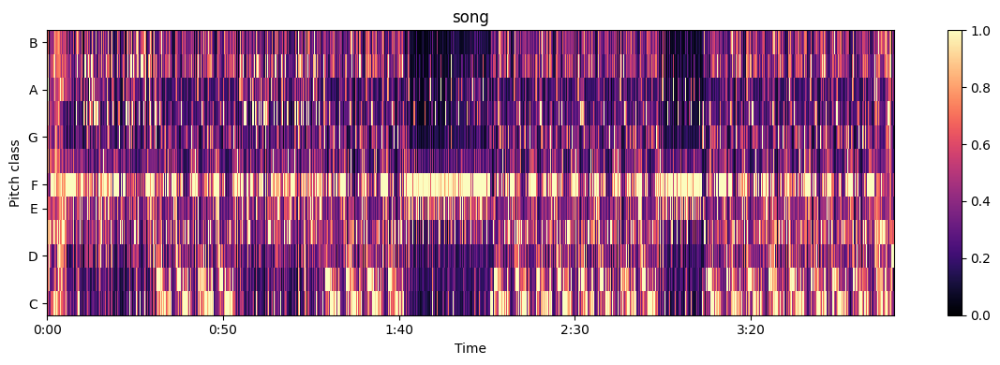

flyingwhales.mp3


/Users/kirtisubramanian/Library/Python/3.9/lib/python/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


[ 0.0000000e+00  0.0000000e+00  0.0000000e+00 ... -2.4702233e-05
 -1.9526029e-05 -2.0491343e-05]
C 	 0.710
C# 	 0.624
D 	 0.823
D# 	 1.000
E 	 0.487
F 	 0.344
F# 	 0.271
G 	 0.616
G# 	 0.544
A 	 0.305
A# 	 0.641
B 	 0.462
likely key: D# major, correlation: 0.644
also possible: C minor, correlation: 0.633
C major 	 -0.015
C# major 	 -0.062
D major 	 -0.165
D# major 	  0.644
E major 	 -0.368
F major 	 -0.183
F# major 	 -0.198
G major 	  0.134
G# major 	  0.452
A major 	 -0.387
A# major 	  0.316
B major 	 -0.166
C minor 	  0.633
C# minor 	 -0.104
D minor 	 -0.005
D# minor 	  0.268
E minor 	 -0.110
F minor 	 -0.050
F# minor 	 -0.579
G minor 	  0.371
G# minor 	  0.102
A minor 	 -0.339
A# minor 	 -0.038
B minor 	 -0.149


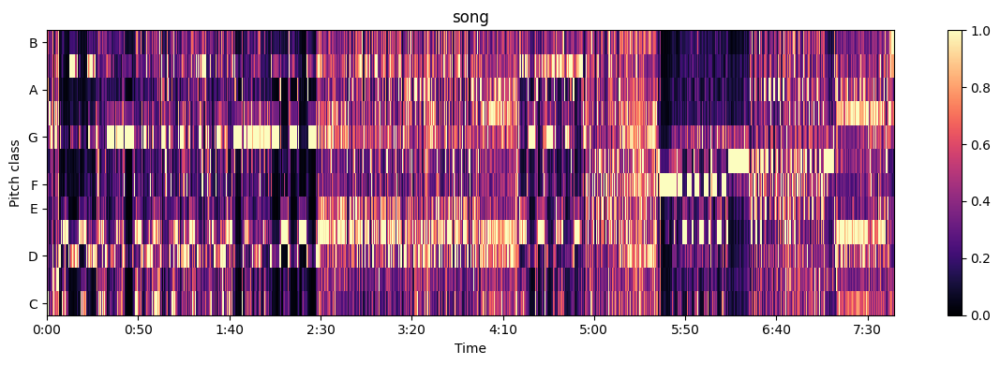

tu.mp3
[ 0.0000000e+00  0.0000000e+00  0.0000000e+00 ...  1.7235362e-07
  2.3691280e-08 -3.0887408e-09]
C 	 0.560
C# 	 0.516
D 	 0.739
D# 	 0.445
E 	 0.535
F 	 0.684
F# 	 0.433
G 	 1.000
G# 	 0.631
A 	 0.829
A# 	 0.473
B 	 0.296
likely key: G minor, correlation: 0.557
also possible: D minor, correlation: 0.516
C major 	  0.480
C# major 	 -0.208
D major 	  0.402
D# major 	  0.040
E major 	 -0.365
F major 	  0.394
F# major 	 -0.641
G major 	  0.510
G# major 	 -0.102
A major 	  0.103
A# major 	  0.152
B major 	 -0.766
C minor 	  0.137
C# minor 	 -0.240
D minor 	  0.516
D# minor 	 -0.611
E minor 	  0.119
F minor 	  0.148
F# minor 	 -0.057
G minor 	  0.557
G# minor 	 -0.451
A minor 	  0.363
A# minor 	 -0.274
B minor 	 -0.209


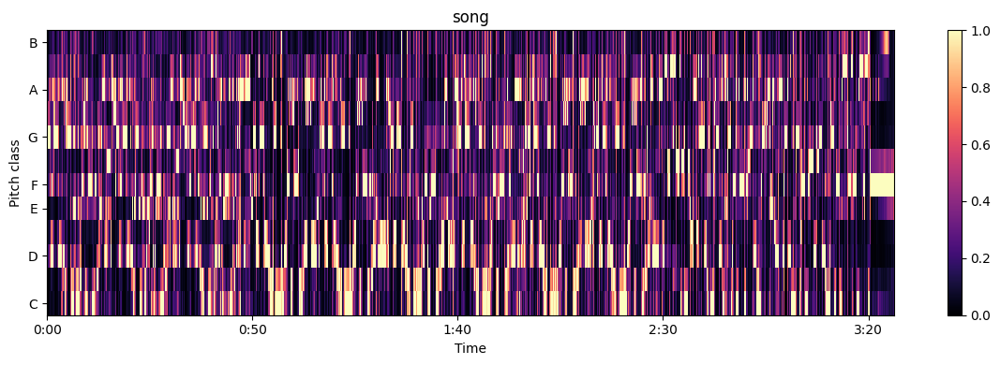

chanel-Copy1.mp3


/Users/kirtisubramanian/Library/Python/3.9/lib/python/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


[0.         0.         0.         ... 0.00013674 0.00012    0.00012366]
C 	 0.191
C# 	 0.315
D 	 0.546
D# 	 0.335
E 	 0.172
F 	 0.298
F# 	 0.733
G 	 1.000
G# 	 0.820
A 	 0.597
A# 	 0.282
B 	 0.335
likely key: D major, correlation: 0.421
C major 	 -0.058
C# major 	  0.014
D major 	  0.421
D# major 	  0.043
E major 	 -0.165
F major 	 -0.271
F# major 	  0.012
G major 	  0.368
G# major 	  0.004
A major 	 -0.040
A# major 	 -0.231
B major 	 -0.095
C minor 	 -0.028
C# minor 	 -0.181
D minor 	 -0.080
D# minor 	 -0.086
E minor 	  0.008
F minor 	 -0.109
F# minor 	  0.295
G minor 	  0.378
G# minor 	  0.117
A minor 	 -0.171
A# minor 	 -0.315
B minor 	  0.171


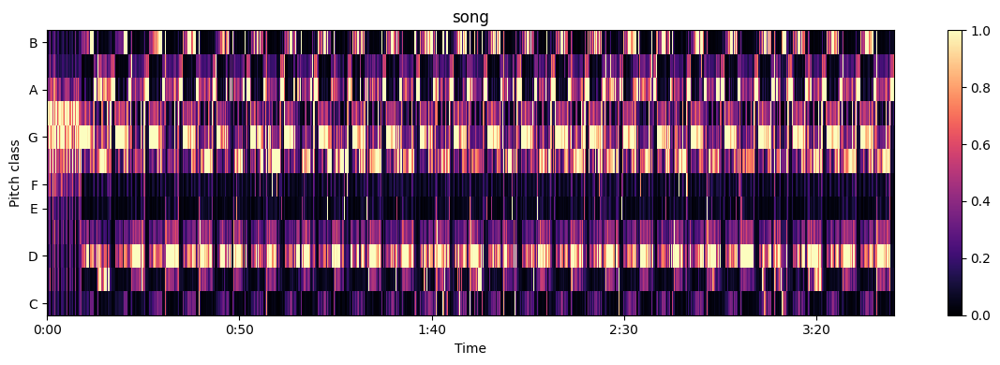

love&war.mp3
[-4.6639165e-24  6.3959687e-24 -8.2023753e-24 ...  5.3228036e-04
  5.8652525e-04  7.0715463e-04]
C 	 0.182
C# 	 0.963
D 	 1.000
D# 	 0.269
E 	 0.168
F 	 0.162
F# 	 0.823
G 	 0.613
G# 	 0.195
A 	 0.570
A# 	 0.278
B 	 0.315
likely key: D major, correlation: 0.688
also possible: F# minor, correlation: 0.64
C major 	 -0.243
C# major 	  0.139
D major 	  0.688
D# major 	 -0.400
E major 	 -0.220
F major 	 -0.302
F# major 	  0.324
G major 	  0.304
G# major 	 -0.383
A major 	  0.365
A# major 	 -0.194
B major 	 -0.079
C minor 	 -0.376
C# minor 	  0.127
D minor 	  0.257
D# minor 	 -0.049
E minor 	 -0.147
F minor 	 -0.477
F# minor 	  0.640
G minor 	  0.163
G# minor 	 -0.381
A minor 	 -0.250
A# minor 	  0.003
B minor 	  0.489


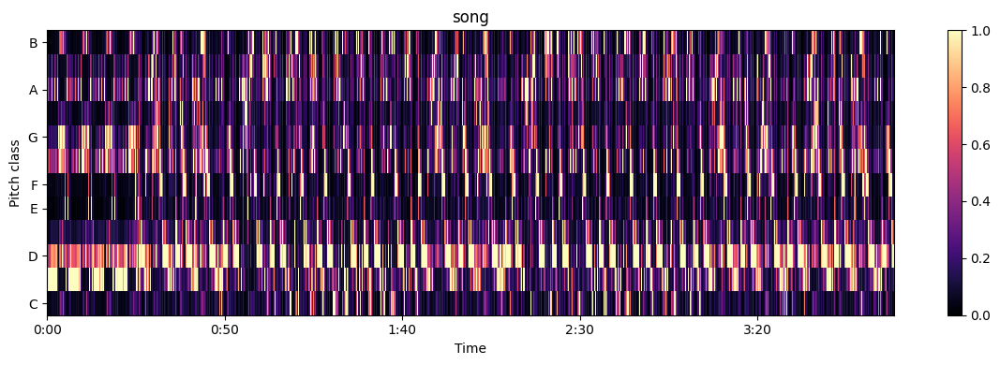

ungrateful.mp3
[-5.3871702e-15 -8.3649044e-15 -7.7901044e-15 ... -4.2465257e-07
  1.7114604e-06 -1.2635832e-06]
C 	 0.601
C# 	 1.000
D 	 0.459
D# 	 0.389
E 	 0.303
F 	 0.239
F# 	 0.237
G 	 0.426
G# 	 0.399
A 	 0.240
A# 	 0.165
B 	 0.120
likely key: C# minor, correlation: 0.546
also possible: C# major, correlation: 0.532
C major 	  0.080
C# major 	  0.532
D major 	 -0.124
D# major 	 -0.104
E major 	 -0.183
F major 	 -0.147
F# major 	  0.082
G major 	  0.008
G# major 	  0.361
A major 	  0.041
A# major 	 -0.253
B major 	 -0.293
C minor 	  0.201
C# minor 	  0.546
D minor 	 -0.080
D# minor 	 -0.251
E minor 	 -0.182
F minor 	  0.207
F# minor 	  0.041
G minor 	 -0.132
G# minor 	 -0.154
A minor 	 -0.139
A# minor 	  0.169
B minor 	 -0.226


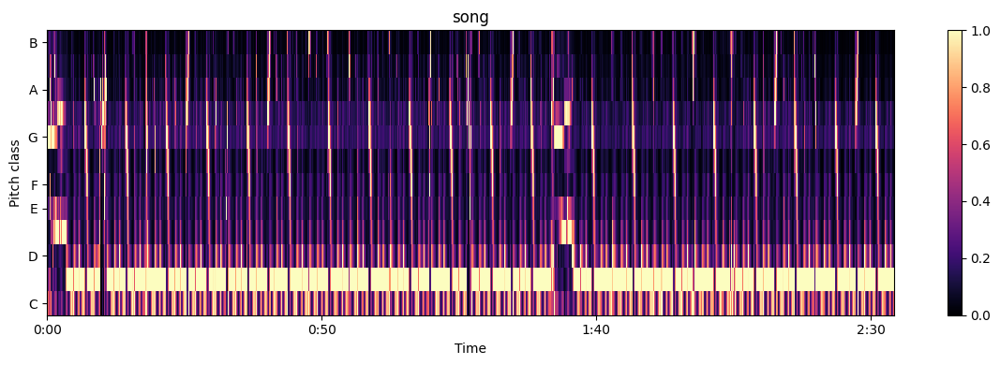

likely key: C# major, correlation: 0.518
also possible: C# minor, correlation: 0.512
C major 	  0.086
C# major 	  0.518
D major 	 -0.117
D# major 	 -0.174
E major 	 -0.200
F major 	 -0.078
F# major 	  0.126
G major 	 -0.007
G# major 	  0.289
A major 	  0.048
A# major 	 -0.213
B major 	 -0.277
C minor 	  0.163
C# minor 	  0.512
D minor 	 -0.029
D# minor 	 -0.254
E minor 	 -0.212
F minor 	  0.193
F# minor 	  0.063
G minor 	 -0.168
G# minor 	 -0.222
A minor 	 -0.115
A# minor 	  0.233
B minor 	 -0.164


In [17]:
# for extracting likely key/s for each song + spectogram
for song in songs_list:
    if song[-3:] == 'mp3':
        print(song)
        y, sr = librosa.load(song)
        Audio(data=y, rate=sr)
        print(y)
    
    onset_env = librosa.onset.onset_strength(y=y, sr=sr)
    tempo = librosa.beat.tempo(onset_envelope=onset_env, sr=sr)
    tempo
          
            
    y_harmonic, y_percussive = librosa.effects.hpss(y)
        
    song_tonal_analysis = Tonal_Fragment(y_harmonic, sr, tend=22)
    song_tonal_analysis.print_chroma()
    song_tonal_analysis.print_key()
    song_tonal_analysis.corr_table()
    song_tonal_analysis.chromagram("song")
    
    unebarque_e_min = Tonal_Fragment(y_harmonic, sr, tstart=0)
unebarque_e_min.print_key()
unebarque_e_min.corr_table()

In [18]:
# getting volume graph for each song in the list
def extract_volume(song):
    y, sr = librosa.load(song)
    Audio(data=y, rate=sr)
    rms = librosa.feature.rms(y=y)
    # plt.plot(rms[0])
    # plt.show()
    # print(rms)
    # print("volume mean: " + str(np.mean(rms[0])))
    # print("volume max: " + str(np.max(rms[0])))
    return np.mean(rms[0]), np.max(rms[0])

In [19]:
# tempo function
def extract_tempo(song):
    y, sr = librosa.load(song)
    Audio(data=y, rate=sr)
    onset_env = librosa.onset.onset_strength(y=y, sr=sr)
    tempo = librosa.beat.tempo(onset_envelope=onset_env, sr=sr)
    # print("tempo: " + str(tempo))
    return tempo

In [20]:
def extract_key(song):
    y, sr = librosa.load(song)
    Audio(data=y, rate=sr)
    # print(y)
    
    onset_env = librosa.onset.onset_strength(y=y, sr=sr)
    tempo = librosa.beat.tempo(onset_envelope=onset_env, sr=sr)
          
            
    y_harmonic, y_percussive = librosa.effects.hpss(y)
    
    """
    song_tonal_analysis = Tonal_Fragment(y_harmonic, sr, tend=22)
    song_tonal_analysis.print_chroma()
    song_tonal_analysis.print_key()
    song_tonal_analysis.corr_table()
    song_tonal_analysis.chromagram("song")
    """    
    
    keyanalysis = Tonal_Fragment(y_harmonic, sr, tstart=0)
    # keyanalysis.print_key()
    # unebarque_e_min.corr_table()
    return keyanalysis.correlation_coefficients()

In [21]:
list_of_emotions = []
list_of_all_songs = []
for song in songs_list:
    if song[-3:] == 'mp3':
        #print(song)
        tempo = extract_tempo(song)
        volume = extract_volume(song)
        key = extract_key(song)
        key_probabilities = [x[1] for x in list(key)]
        combined_list = [tempo[0]] + [volume[0], volume[1]] + key_probabilities
        #print(combined_list)
        list_of_all_songs += [combined_list]
    else:
        print(song)
        # I think I need to add the below code here???
print(list_of_all_songs)

/Users/kirtisubramanian/Library/Python/3.9/lib/python/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.
/Users/kirtisubramanian/Library/Python/3.9/lib/python/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.
/Users/kirtisubramanian/Library/Python/3.9/lib/python/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.
/Users/kirtisubramanian/Library/Python/3.9/lib/python/site-packages/librosa/util/decorators.py:88: User

/Users/kirtisubramanian/Library/Python/3.9/lib/python/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.
/Users/kirtisubramanian/Library/Python/3.9/lib/python/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.
/Users/kirtisubramanian/Library/Python/3.9/lib/python/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.
/Users/kirtisubramanian/Library/Python/3.9/lib/python/site-packages/librosa/util/decorators.py:88: User

.ipynb_checkpoints


/Users/kirtisubramanian/Library/Python/3.9/lib/python/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.
/Users/kirtisubramanian/Library/Python/3.9/lib/python/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.
/Users/kirtisubramanian/Library/Python/3.9/lib/python/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.
/Users/kirtisubramanian/Library/Python/3.9/lib/python/site-packages/librosa/util/decorators.py:88: User

[[107.666015625, 0.023243185, 0.062321976, 0.608, -0.473, 0.18, -0.303, 0.262, 0.49, -0.723, 0.216, -0.35, 0.426, 0.051, -0.386, -0.078, 0.059, 0.5, -0.588, 0.523, 0.088, -0.151, -0.075, -0.421, 0.718, -0.369, -0.205], [112.34714673913044, 0.069174424, 0.35008556, -0.339, 0.375, -0.097, -0.057, 0.47, -0.618, 0.273, -0.338, 0.425, 0.186, -0.681, 0.399, -0.111, 0.535, -0.597, 0.204, -0.02, 0.066, 0.383, -0.501, 0.626, -0.143, -0.276, -0.168], [143.5546875, 0.21562083, 0.6415781, -0.352, -0.159, -0.364, 0.491, 0.204, -0.381, 0.182, -0.263, 0.136, -0.158, 0.131, 0.534, 0.183, 0.02, -0.397, 0.688, 0.099, -0.319, -0.336, -0.058, 0.403, -0.318, 0.041, -0.006], [135.99917763157896, 0.291352, 0.48323843, 0.585, 0.098, -0.236, 0.102, -0.315, 0.149, -0.18, 0.255, 0.415, -0.307, -0.212, -0.355, 0.719, 0.027, -0.257, -0.338, 0.018, 0.314, -0.228, 0.053, -0.131, 0.232, -0.115, -0.295], [151.99908088235293, 0.070655346, 0.2958413, 0.843, -0.662, 0.333, -0.269, 0.048, 0.186, -0.613, 0.852, -0.334, 0.0

In [22]:
graph_colors = ['red', 'cyan', 'hotpink', 'lightslategrey']
from sklearn.decomposition import PCA
import csv
emotions_list = []
 
# opening the CSV file
#with open('final_music_dataset - Sheet1 (1).csv', mode ='r')as file:
with open('final_music_dataset - Sheet1 (1).csv', mode ='r')as file:
   
  # reading the CSV file
  csvFile = csv.reader(file)
 
  # displaying the contents of the CSV file
  n = 0
  for line in csvFile:
        # print(lines)
        if n >= 1:
            if line[3] == 'calm/neutral':
                emotions_list += [graph_colors[1]] 
            elif line[3] == 'happy/joyous':
                emotions_list += [graph_colors[2]] 
            elif line[3] == 'sad/melancholy':
                emotions_list += [graph_colors[3]] 
            elif line[3] == 'angry/restlessness':
                emotions_list += [graph_colors[0]] 
            else:
                print(line[3])
        n += 1
        # print(line[3] == "calm/neutral")
        
pca = PCA(n_components=2)
list_of_songs_numpy = np.array(list_of_all_songs)
print(list_of_songs_numpy)
two_d_output = pca.fit_transform(list_of_songs_numpy)
print(two_d_output)
print(emotions_list)

[[ 1.07666016e+02  2.32431851e-02  6.23219758e-02  6.08000000e-01
  -4.73000000e-01  1.80000000e-01 -3.03000000e-01  2.62000000e-01
   4.90000000e-01 -7.23000000e-01  2.16000000e-01 -3.50000000e-01
   4.26000000e-01  5.10000000e-02 -3.86000000e-01 -7.80000000e-02
   5.90000000e-02  5.00000000e-01 -5.88000000e-01  5.23000000e-01
   8.80000000e-02 -1.51000000e-01 -7.50000000e-02 -4.21000000e-01
   7.18000000e-01 -3.69000000e-01 -2.05000000e-01]
 [ 1.12347147e+02  6.91744238e-02  3.50085557e-01 -3.39000000e-01
   3.75000000e-01 -9.70000000e-02 -5.70000000e-02  4.70000000e-01
  -6.18000000e-01  2.73000000e-01 -3.38000000e-01  4.25000000e-01
   1.86000000e-01 -6.81000000e-01  3.99000000e-01 -1.11000000e-01
   5.35000000e-01 -5.97000000e-01  2.04000000e-01 -2.00000000e-02
   6.60000000e-02  3.83000000e-01 -5.01000000e-01  6.26000000e-01
  -1.43000000e-01 -2.76000000e-01 -1.68000000e-01]
 [ 1.43554688e+02  2.15620831e-01  6.41578078e-01 -3.52000000e-01
  -1.59000000e-01 -3.64000000e-01  4.910

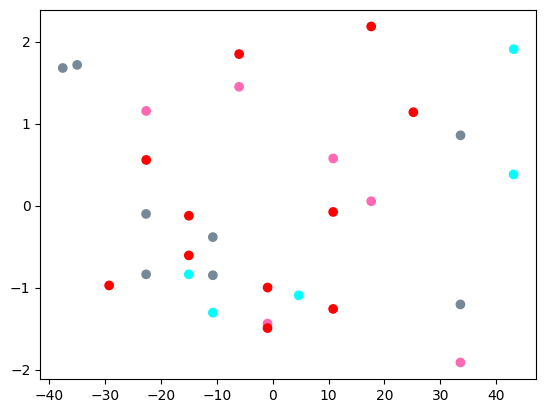

In [23]:
import matplotlib.pyplot as plt
plt.scatter([v[0] for v in two_d_output], [v[1] for v in two_d_output], c = emotions_list)
plt.show()

In [24]:
#import csv
 
# opening the CSV file
#with open('Music Dataset - Sheet1.csv', mode ='r')as file:
   
  # reading the CSV file
 # csvFile = csv.reader(file)
 
  # displaying the contents of the CSV file
  #for lines in csvFile:
       # print(lines)
        #print(lines[3])